# Summary

In this notebook we explore whether MMBGP can rediscover early branching.

We set uninformative prior (that is, priorConfidence=0.5) 
for early cells (say, up to pseudotime 0.8), but an informative prior later.
Can we then rediscover the early cell labels and branching time?

We will take 10 random samples with a fixed, maximal noise level on 10 genes.
We want the noise as high as possible provided the models don't go pear-shaped.

Measure RMSE on BPs and label inconsistencies.

Key figure: rows are genes, MMBGP on the left, BGP on the right. Compare per gene.

## 1 gene spot checks

Let's spot-check the data generation functions.
We're using a model to sample from.
We want 10 samples of 1 gene branching at e.g. 0.5.

In [1]:
from MMBGP.data_generation import ToyBranchedData, GeneExpressionData
from MMBGP.training_helpers import TrainingOutcome, get_training_outcome
from MMBGP.plotting_helpers import plot_detailed_fit, plot_model_snapshot
from MMBGP.sampling_helpers import get_synthetic_noisy_branched_data

from MMBGP.assigngp import AssignGP
from MMBGP.VBHelperFunctions import plotBranchModel
import matplotlib.pyplot as plt
import numpy as np

from MMBGP.training_helpers import (
    construct_assigngp_model, 
    SimplePhiConstructor, 
    ScipyOptimiser, 
    ElvijsAmazingOptimiser,
)
import gpflow
from typing import Sequence


def get_assigngp_with_target_bps(bps: Sequence[float], lengthscale: float, noise_variance: float) -> AssignGP:
    """ A simple wrapper that tweaks some key model construction parameters. """
    data = ToyBranchedData(bps, N=100)  # not used; need data to construct a model
    m = construct_assigngp_model(
        gene_expression=data,
        phi_constructor=SimplePhiConstructor(data, prior_confidence=0.65),
        initial_branching_points=[0.5]*data.num_genes,
    )
    
    # assign reasonable initial values for the BPs
    m.kernel.Bv.assign(np.array(bps))
    m.kernel.kern.lengthscales.assign(lengthscale)
    m.likelihood.variance.assign(noise_variance)
    return m


model = get_assigngp_with_target_bps([0.5], lengthscale=0.5, noise_variance=0.001)
model

name,class,transform,prior,trainable,shape,dtype,value
AssignGP.ZExpanded,Parameter,Identity,,False,"(180, 2)",float64,"[[0., 1...."
AssignGP.kernel.kern.variance,Parameter,Softplus,,True,(),float64,1.0
AssignGP.kernel.kern.lengthscales,Parameter,Softplus,,True,(),float64,0.5
AssignGP.kernel.Bv,Parameter,Sigmoid,,True,"(1,)",float64,[0.5]
AssignGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,0.0010000000000000002
AssignGP.logPhi,Parameter,Identity,,True,"(100, 300)",float64,"[[-20.72326584, -0.66220178, -0.72508086..."


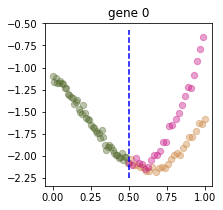

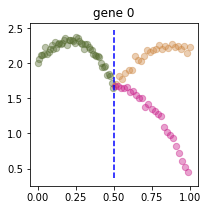

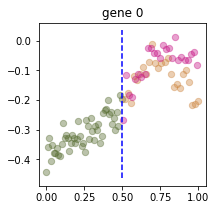

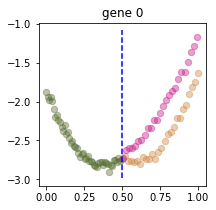

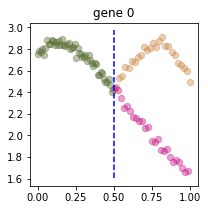

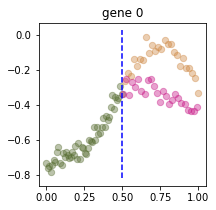

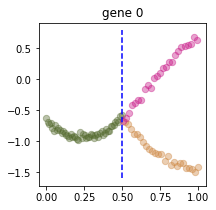

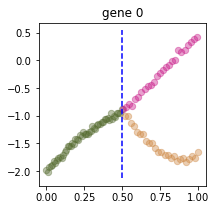

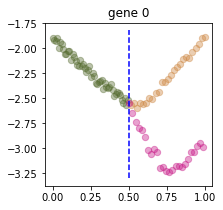

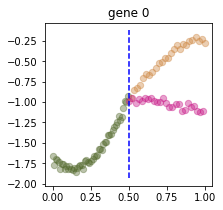

In [2]:
for bd in get_synthetic_noisy_branched_data(model, num_samples=10, x_pts=100):
    bd.plot()

OK, the data looks reasonably sensible.
We can also see that the 10 samples lead to quite a bit of variation
in the synthetic data.

## 10 gene spot checks

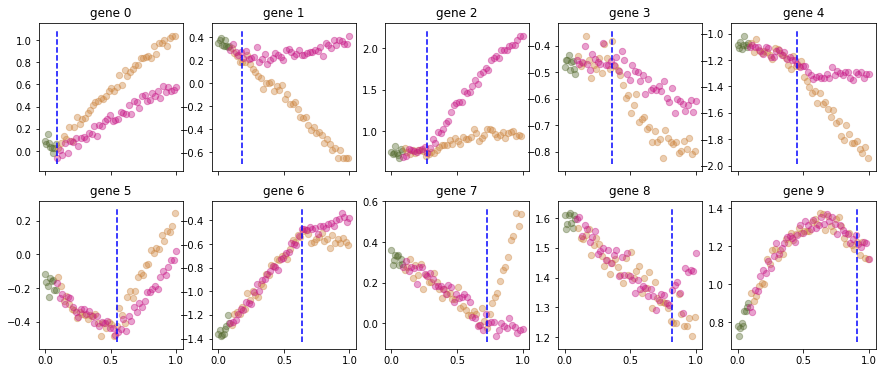

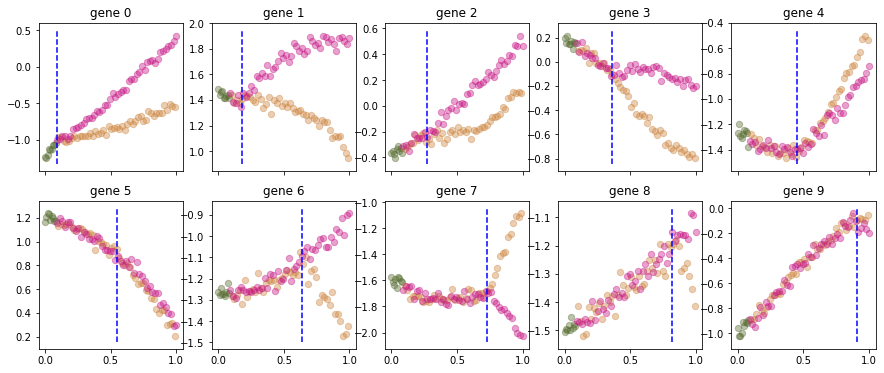

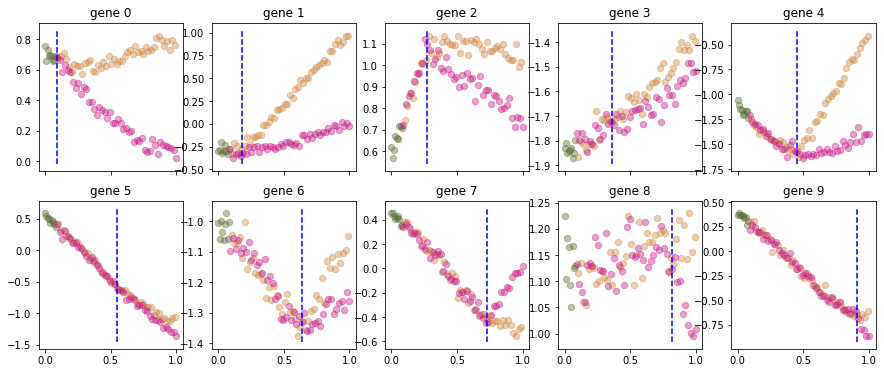

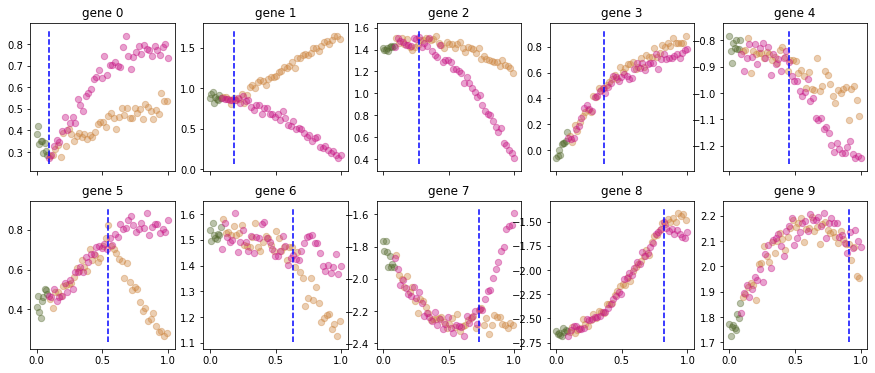

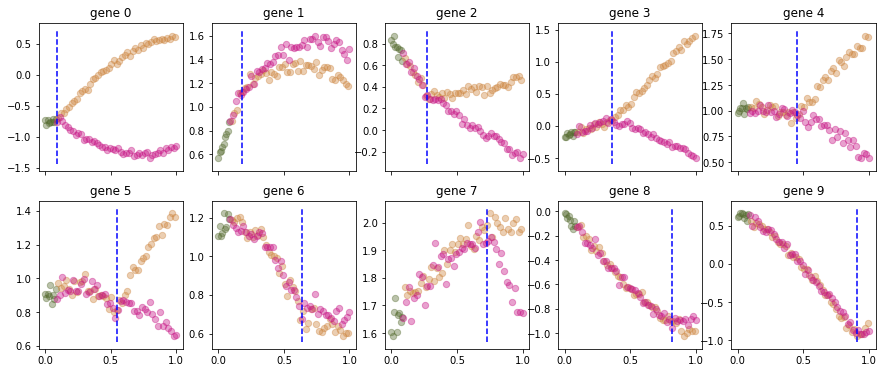

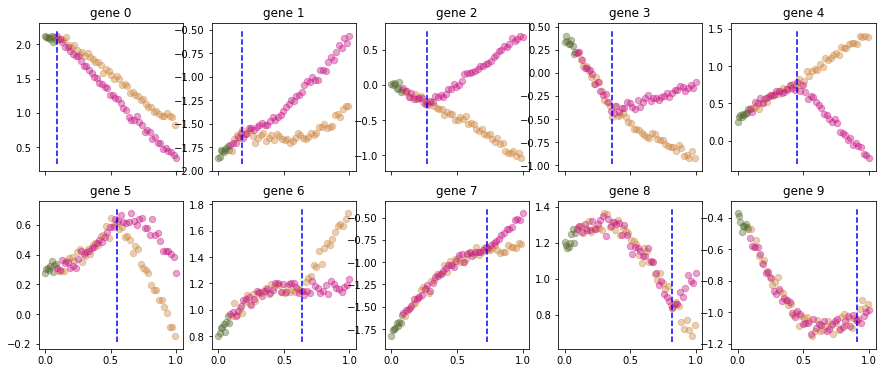

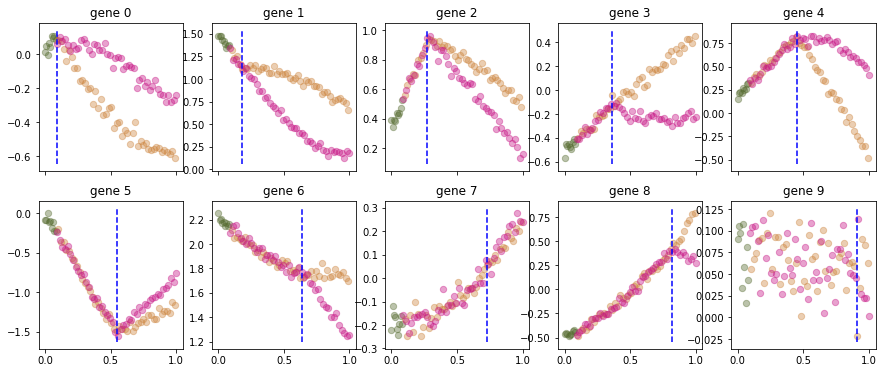

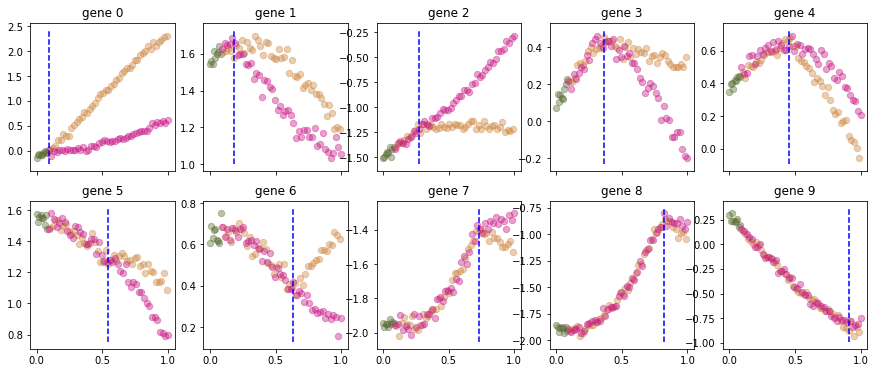

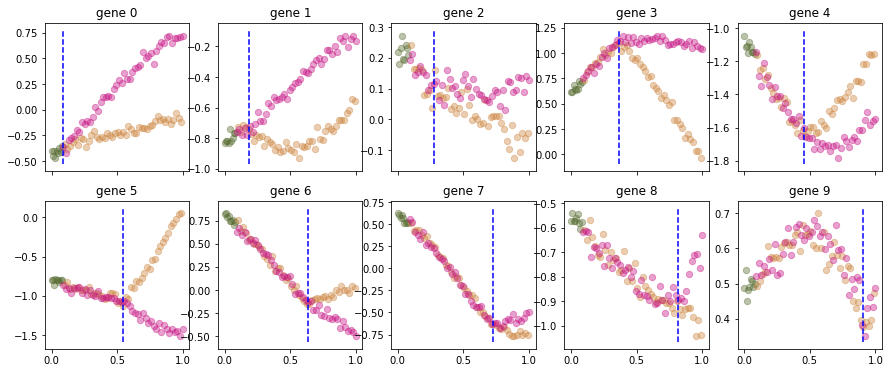

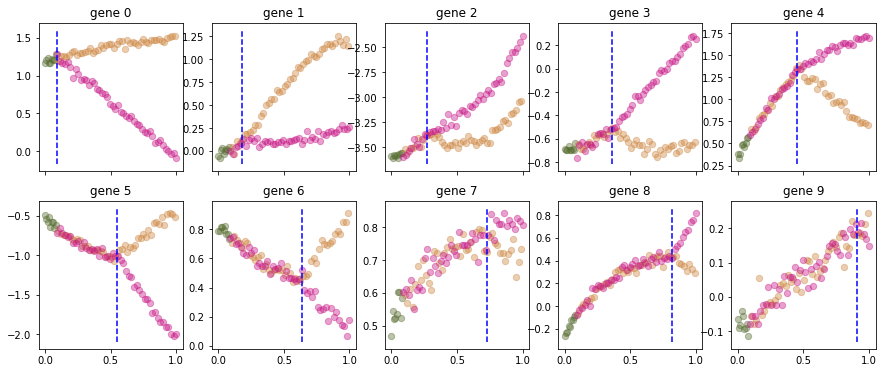

In [3]:
model = get_assigngp_with_target_bps([i/11 for i in range(1, 11, 1)], lengthscale=1., noise_variance=0.001)

for bd in get_synthetic_noisy_branched_data(model, num_samples=10, x_pts=100):
    bd.plot()

## Tuning the noise levels
### 1 gene setting

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

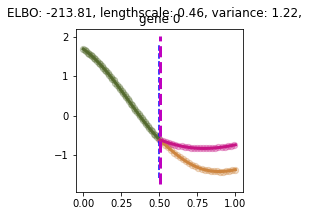

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

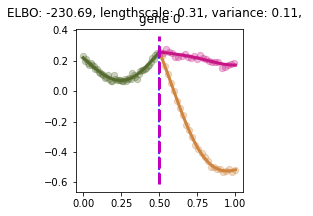

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

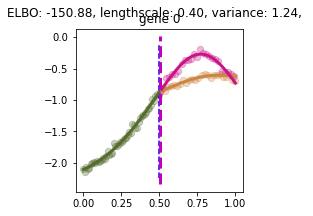

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

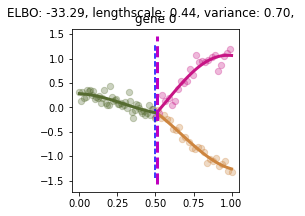

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

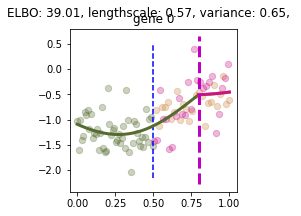

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

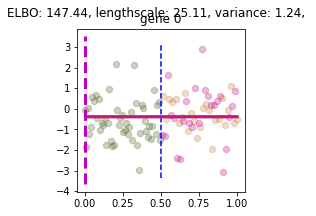

In [4]:
for noise_exponent in range(-5, 1, 1):
    dummy_model = get_assigngp_with_target_bps([0.5], lengthscale=0.5, noise_variance=10**noise_exponent)
    print("Sampling branching data from the following model")
    gpflow.utilities.print_summary(dummy_model)
    gene_expressions = get_synthetic_noisy_branched_data(dummy_model, num_samples=1, x_pts=100)
    data = gene_expressions[0]
    
    print("Constructing a fresh model")
    # new model with default-ey parameter values
    new_model = construct_assigngp_model(
        gene_expression=data,
        phi_constructor=SimplePhiConstructor(data, prior_confidence=0.5),
        initial_branching_points=[0.1],  # Don't start at the true location
    )
    gpflow.utilities.print_summary(new_model)
    
    optimiser = ElvijsAmazingOptimiser()
    trained_model = optimiser.train(new_model)
    print("Trained model")
    gpflow.utilities.print_summary(trained_model)
    
    plot_model_snapshot(trained_model, genes=gene_expressions[0], alpha=0.3)
    plt.show()

### 10 gene setting

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

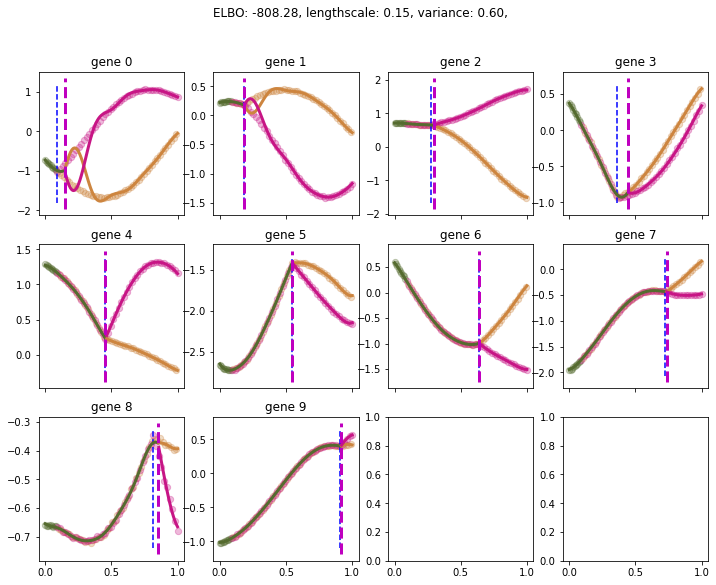

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

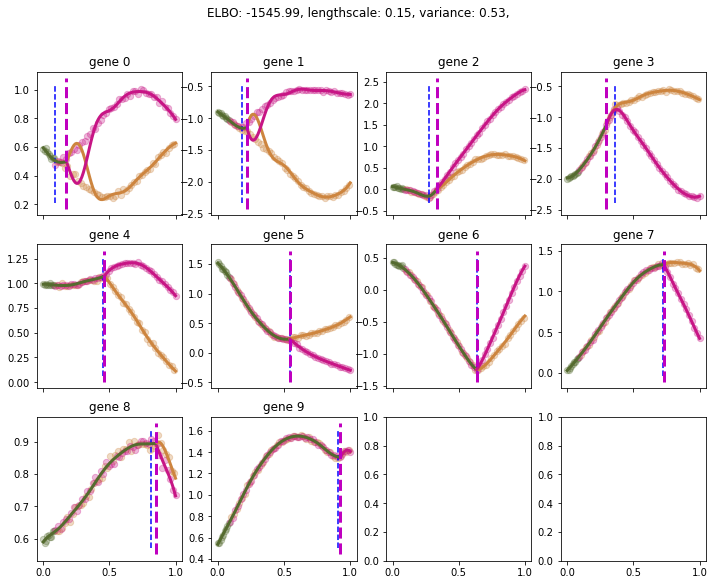

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

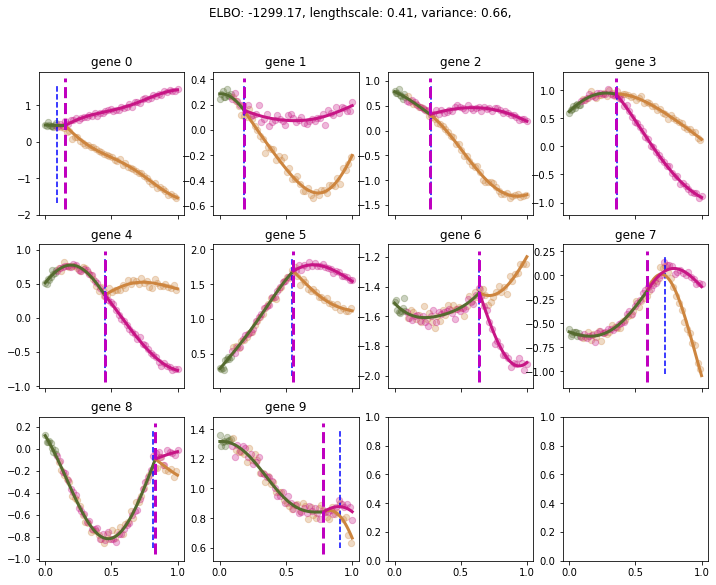

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

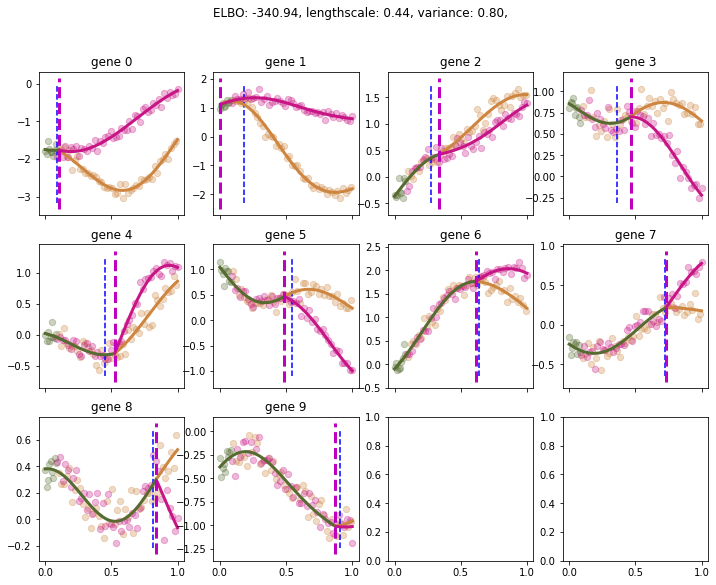

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

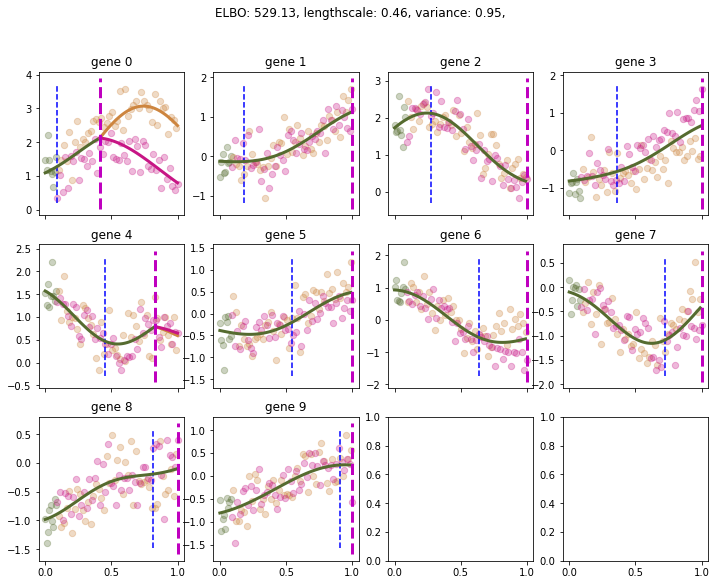

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

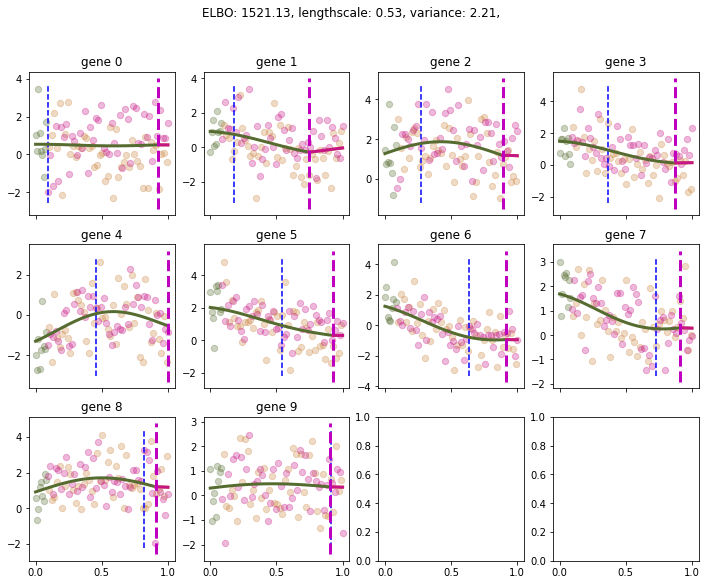

In [6]:
for noise_exponent in range(-5, 1, 1):
    dummy_model = get_assigngp_with_target_bps(
        [i/11 for i in range(1, 11, 1)], 
        lengthscale=0.5, 
        noise_variance=10**noise_exponent,
    )
    print("Sampling branching data from the following model")
    gpflow.utilities.print_summary(dummy_model)
    gene_expressions = get_synthetic_noisy_branched_data(dummy_model, num_samples=1, x_pts=100)
    data = gene_expressions[0]
    
    print("Constructing a fresh model")
    # new model with default-ey parameter values
    new_model = construct_assigngp_model(
        gene_expression=data,
        phi_constructor=SimplePhiConstructor(data, prior_confidence=0.5),
        initial_branching_points=[0.45]*10,  # Don't start at the true locations
    )
    gpflow.utilities.print_summary(new_model)
    
    optimiser = ElvijsAmazingOptimiser()
    trained_model = optimiser.train(new_model)
    print("Trained model")
    gpflow.utilities.print_summary(trained_model)
    
    plot_model_snapshot(trained_model, genes=gene_expressions[0], alpha=0.3)
    plt.show()

Some observations:

* We have problems with fits when the noise level is low. 
  We will ignore this issue for now as the low-noise setting is not realistic.
  However, we will note some potential mitigations we might want to look at 
  in the future:
  - Bound lengthscale from below.
  - Fix high lengthscale, optimise labels, then optimise lengthscale.
* Overall though the fits are encouraging, 
  despite the problem above being harder than the one we're supposed to solve - 
  informative prior for late pseudotimes.
* Plots: 
  - x: distance between ground truth BP and learned BP, y: prior strength
  - x: distance between ground truth BP and learned BP, y: noise level
* For comparisons with BGP - use MMBGP, but on single genes

# Funky prior

We set uninformative prior (that is, priorConfidence=0.5) for early cells (say, up to pseudotime 0.8), but an informative prior later.

In [21]:
from MMBGP.data_generation import Vector
from MMBGP.training_helpers import InitialAndPriorPhi, PhiConstructor


def get_funky_phi(
        global_branching_state: Vector,
        uninformative_until: float,
        informative_prior_confidence: float,
) -> InitialAndPriorPhi:
    if not 0 <= uninformative_until <= 1:
        raise ValueError(
            f"Expected uninformative_until to be in the range [0, 1]. "
            f"Instead got: {uninformative_until}."
        )
    if not 0 <= informative_prior_confidence <= 1:
        raise ValueError(
            f"Expected informative_prior_confidence to be in the range [0, 1]. "
            f"Instead got: {uninformative_until}."
        )

    (N,) = global_branching_state.shape
    # WARNING: assumes uniformly spaced state on [0, 1].
    uninformative_until_idx = int(uninformative_until * N)
    print(f"Uninformative until idx: {uninformative_until_idx}")

    # Initialise phi_initial and phi_prior to 50% probability for each of the branches g, h
    # We will then update them
    phi_initial = np.ones((N, 2)) * 0.5
    phi_prior = np.ones((N, 2)) * 0.5

    # TODO: the following can probably be written as pure numpy array operations,
    #   but we're taking the easy way for speed.
    for i in range(N):
        not_trunk = global_branching_state[i] in {2, 3}

        if not_trunk:
            # The g, h states normally map to 2, 3, but here we want to map them to columns 0, 1
            true_branch_col = int(global_branching_state[i] - 2)
            if i > uninformative_until_idx:
                phi_prior[i, :] = 1 - informative_prior_confidence
                phi_prior[i, true_branch_col] = informative_prior_confidence
            # else leave at 0.5, 0.5

            # Set phi_initial to have true state label with a random probability in [0.5, 1]
            # This is the same as SimplePhiConstructor
            phi_initial[i, true_branch_col] = 0.5 + (np.random.random() / 2.)
            phi_initial[i, true_branch_col != np.array([0, 1])] = 1 - phi_initial[i, true_branch_col]

    assert np.allclose(phi_prior.sum(1), 1), \
        f"Phi Prior probability distribution should sum to 1 for each branch. " \
        f"Instead got: {phi_prior.sum(1)}"
    assert np.allclose(phi_initial.sum(1), 1), \
        f"Phi Initial probability distribution should sum to 1 for each branch. " \
        f"Instead got: {phi_initial.sum(1)}"
    assert np.all(~np.isnan(phi_initial)), f"Found NaNs in phi_initial, something has gone badly wrong!"
    assert np.all(~np.isnan(phi_prior)), f"Found NaNs in phi_prior, something has gone badly wrong!"
    return phi_initial, phi_prior


class FunkyPrior(PhiConstructor):
    """
    Uninformative prior for early cells, informative prior for late cells.
    """

    def __init__(
            self,
            gene_expression_data: GeneExpressionData,
            uninformative_until: float,
            informative_prior_confidence: float,
            allow_infs: bool = True,
    ) -> None:
        self._state = gene_expression_data.state
        self._uninformative_until = uninformative_until
        self._informative_prior_confidence = informative_prior_confidence
        self._allow_infs = allow_infs

    def build(self) -> InitialAndPriorPhi:
        phi_initial, phi_prior = get_funky_phi(
            global_branching_state=self._state,
            uninformative_until=self._uninformative_until,
            informative_prior_confidence=self._informative_prior_confidence,
        )

        phi_prior = np.c_[np.zeros(phi_prior.shape[0])[:, None], phi_prior]  # prepend 0 for trunk
        return phi_initial, phi_prior

## Sanity check the implementation

`phi_initial` uniformly samples `[0.5, 1]` as the probability of the true state.
`phi_prior` provides `prior_confidence` as the probability of the true state. Let's just see it in action.

In [18]:
toy_data = ToyBranchedData(B=(0.5,), N=10)

for prior_confidence in [0.5, 0.75, 1.]:
    print(f"SimplePhiConstructor Prior confidence: {prior_confidence}")
    phi_init, phi_prior = SimplePhiConstructor(toy_data, prior_confidence).build()
    print(f"State: {toy_data.state}")
    print(f"Phi initial: {phi_init}")
    print(f"Phi prior: {phi_prior}")

SimplePhiConstructor Prior confidence: 0.5
State: [2 3 2 3 2 3 2 3 2 3]
Phi initial: [[0.51029225 0.48970775]
 [0.01504507 0.98495493]
 [0.91622132 0.08377868]
 [0.39383044 0.60616956]
 [0.59091248 0.40908752]
 [0.40829775 0.59170225]
 [0.65212112 0.34787888]
 [0.23762178 0.76237822]
 [0.71597251 0.28402749]
 [0.35438543 0.64561457]]
Phi prior: [[0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]]
SimplePhiConstructor Prior confidence: 0.75
State: [2 3 2 3 2 3 2 3 2 3]
Phi initial: [[0.51029225 0.48970775]
 [0.01504507 0.98495493]
 [0.91622132 0.08377868]
 [0.39383044 0.60616956]
 [0.59091248 0.40908752]
 [0.40829775 0.59170225]
 [0.65212112 0.34787888]
 [0.23762178 0.76237822]
 [0.71597251 0.28402749]
 [0.35438543 0.64561457]]
Phi prior: [[0.   0.75 0.25]
 [0.   0.25 0.75]
 [0.   0.75 0.25]
 [0.   0.25 0.75]
 [0.   0.75 0.25]
 [0.   0.25 0.75]
 [0.   0.75 0.25]
 [0.   0.25 0.75]
 [0.   0.7

Now compare with the funky prior

In [22]:
for prior_confidence in [0.5, 0.75, 1.]:
    for uninformative_until in [0., 0.5, 1.]:
        print(f"FunkyPhi Prior confidence: {prior_confidence}, uninformative until: {uninformative_until}")
        phi_init, phi_prior = FunkyPrior(
            toy_data,
            uninformative_until=uninformative_until,
            informative_prior_confidence=prior_confidence,
        ).build()
        print(f"State: {toy_data.state}")
        print(f"Phi prior: {phi_prior}")

FunkyPhi Prior confidence: 0.5, uninformative until: 0.0
Uninformative until idx: 0
State: [2 3 2 3 2 3 2 3 2 3]
Phi prior: [[0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]]
FunkyPhi Prior confidence: 0.5, uninformative until: 0.5
Uninformative until idx: 5
State: [2 3 2 3 2 3 2 3 2 3]
Phi prior: [[0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]]
FunkyPhi Prior confidence: 0.5, uninformative until: 1.0
Uninformative until idx: 10
State: [2 3 2 3 2 3 2 3 2 3]
Phi prior: [[0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]
 [0.  0.5 0.5]]
FunkyPhi Prior confidence: 0.75, uninformative until: 0.0
Uninformative until idx: 0
State: [2 3 2 3 2 3 2 3 2 3]
Phi prior: [[0.   0.5  0.5 ]
 [0.   0.25 0.75]
 [0.   0.75 0

OK, that looks pretty legit, let's see what's the maximum amount of noise that we can reasonably handle.
Just a reminder that we want the noise high as that is both more impressive as well as more realistic.

## Tuning noise

We saw above that using noise level 0.01 seems to be the upper level of what we can fit back to.
That was essentially using the uninformative prior everywhere.
Here, we will use the new, funky prior and see if we can push the noise level up a little bit more.

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

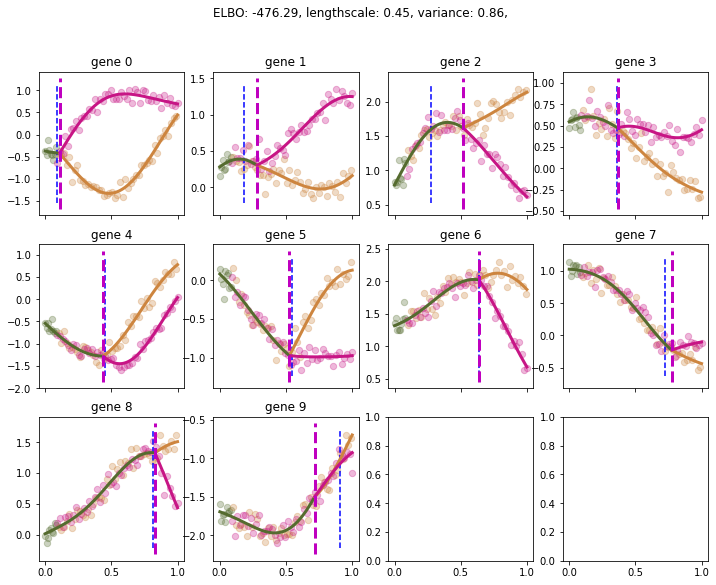

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

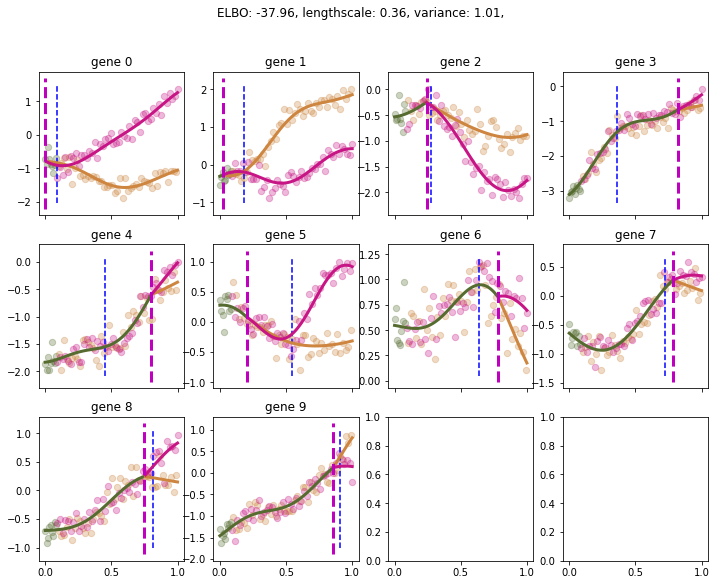

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

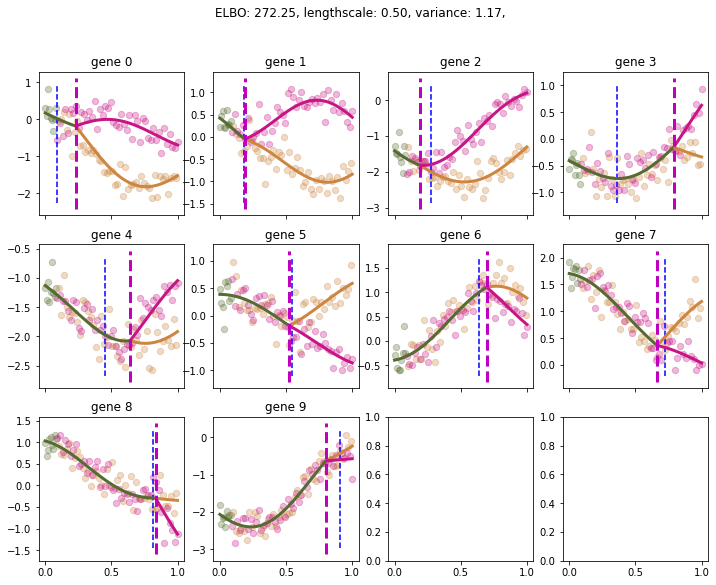

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

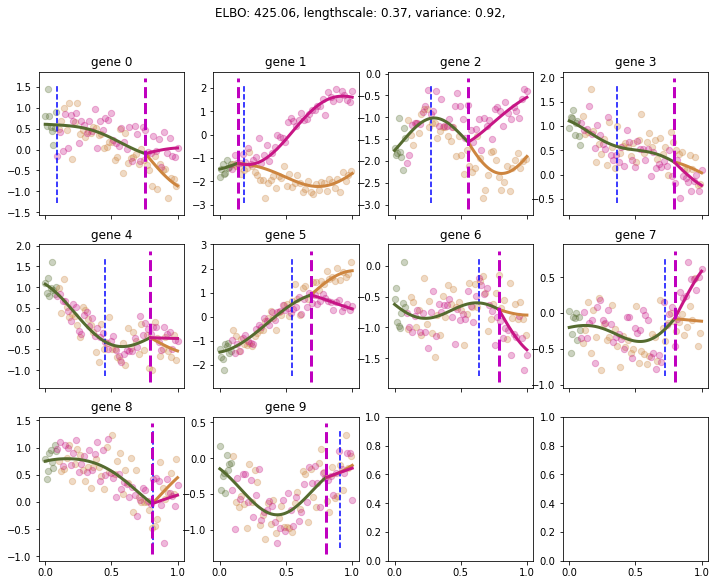

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

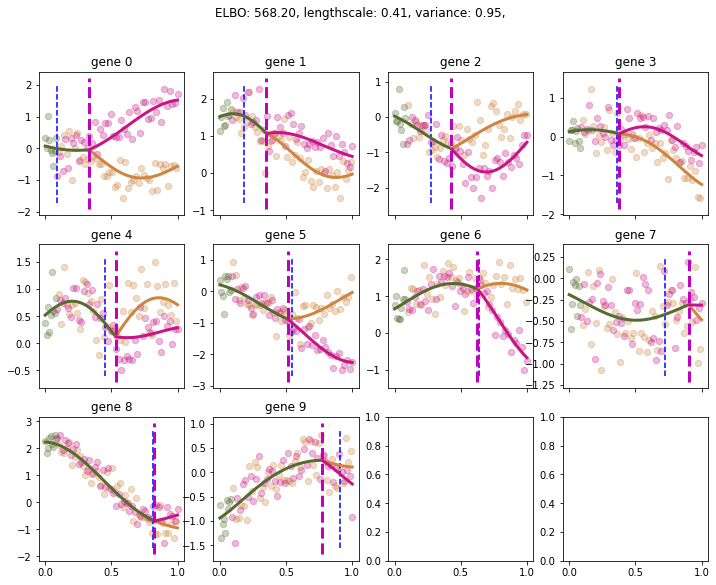

In [26]:
for noise in [0.01, 0.025, 0.05, 0.075, 0.1]:
    dummy_model = get_assigngp_with_target_bps(
        [i/11 for i in range(1, 11, 1)], 
        lengthscale=0.5, 
        noise_variance=noise,
    )
    print("Sampling branching data from the following model")
    gpflow.utilities.print_summary(dummy_model)
    gene_expressions = get_synthetic_noisy_branched_data(dummy_model, num_samples=1, x_pts=100)
    data = gene_expressions[0]
    
    print("Constructing a fresh model")
    # new model with default-ey parameter values
    new_model = construct_assigngp_model(
        gene_expression=data,
        phi_constructor=FunkyPrior(data, informative_prior_confidence=1., uninformative_until=0.8),
        initial_branching_points=[0.5]*10,  # Don't start at the true locations
    )
    gpflow.utilities.print_summary(new_model)
    
    optimiser = ElvijsAmazingOptimiser()
    trained_model = optimiser.train(new_model)
    print("Trained model")
    gpflow.utilities.print_summary(trained_model)
    
    plot_model_snapshot(trained_model, genes=gene_expressions[0], alpha=0.3)
    plt.show()

It looks like we will be cranking up the noise level to 0.1.
We may be able to crank it up even more as the funky prior makes fitting easier.
We will not do that right away though.

# Recovering BGP from MMBGP

We will now sanity check BGP reimplementations via MMBGP.
This should all really be quite straightforward, just a bit of bookkeeping. 

Sampling branching data from the following model
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                      

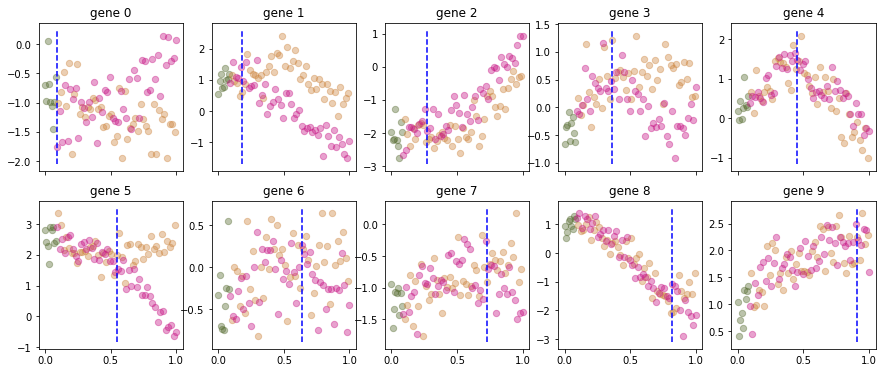

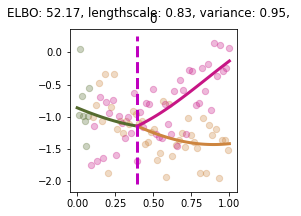

Slicing for gene 1
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                                         │
├────────

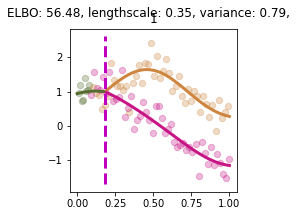

Slicing for gene 2
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                                         │
├────────

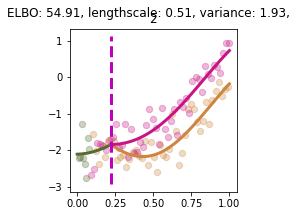

Slicing for gene 3
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                                         │
├────────

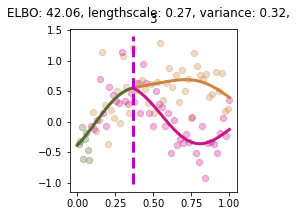

Slicing for gene 4
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                                         │
├────────

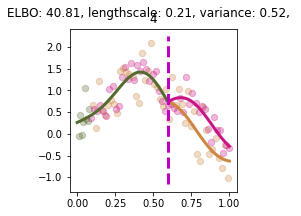

Slicing for gene 5
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                                         │
├────────

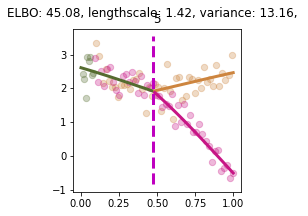

Slicing for gene 6
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                                         │
├────────

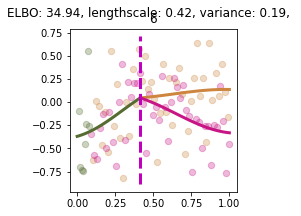

Slicing for gene 7
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                                         │
├────────

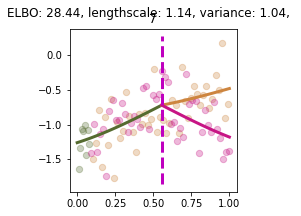

Slicing for gene 8
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                                         │
├────────

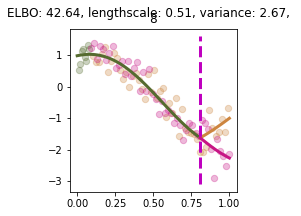

Slicing for gene 9
╒═══════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤════════════╤═════════╤═════════════════════════════════════════════╕
│ name                              │ class     │ transform        │ prior   │ trainable   │ shape      │ dtype   │ value                                       │
╞═══════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪════════════╪═════════╪═════════════════════════════════════════════╡
│ AssignGP.ZExpanded                │ Parameter │ Identity         │         │ False       │ (180, 2)   │ float64 │ [[0., 1....                                 │
├───────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼────────────┼─────────┼─────────────────────────────────────────────┤
│ AssignGP.kernel.kern.variance     │ Parameter │ Softplus         │         │ True        │ ()         │ float64 │ 1.0                                         │
├────────

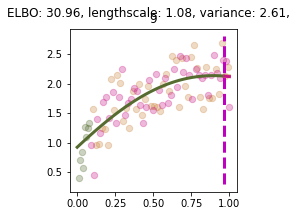

In [30]:
NOISE = 0.1
LENGTHSCALE = 0.5
BGP_PRIOR_CONFIDENCE = 0.8


dummy_model = get_assigngp_with_target_bps(
    [i/11 for i in range(1, 11, 1)], 
    lengthscale=LENGTHSCALE, 
    noise_variance=NOISE,
)
print("Sampling branching data from the following model")
gpflow.utilities.print_summary(dummy_model)
gene_expressions = get_synthetic_noisy_branched_data(dummy_model, num_samples=1, x_pts=100)
data = gene_expressions[0]
data.plot()
bgp_models = []

for i in range(data.num_genes):
    print(f"Slicing for gene {i}")
    
    sliced_data = GeneExpressionData(
        t=data.t,
        Y=data.Y[:, i].reshape(-1, 1),
        state=data.state,
        gene_labels=[f"{i}"]
    )
   
    # new model with default-ey parameter values, but SimplePhiConstructor
    new_model = construct_assigngp_model(
        gene_expression=sliced_data,
        phi_constructor=SimplePhiConstructor(sliced_data, BGP_PRIOR_CONFIDENCE),
        initial_branching_points=[0.5],  # Don't start at the true locations
    )
    gpflow.utilities.print_summary(new_model)
    
    optimiser = ElvijsAmazingOptimiser()
    trained_model = optimiser.train(new_model)
    print("Trained model")
    gpflow.utilities.print_summary(trained_model)
    
    plot_model_snapshot(trained_model, genes=sliced_data, alpha=0.3)
    plt.show()
    
    bgp_models.append(trained_model)

OK, that all looks pretty sensible.
Let's now figure out how to count the label inconsistencies.

In [35]:
print(bgp_models[0].GetPhi()[0])
print(bgp_models[0].BranchingPoints)

[9.64643211e-10 3.61297582e-01 6.03345627e-01]
[0.39393939]


In [37]:
(bgp_models[0].GetPhi()[0] > 0.6).any()

True

In [88]:
def count_branch_inconsistencies(
        models: Sequence[AssignGP], 
        threshold: float, 
        debug: bool = False,
        only_branches: bool = True,
) -> int:
    """ 
    Count how many cell assignments to branches g, h are inconsistent across genes. 
    
    What do we mean by inconsistent cell assignments to branches g, h?
    Set n = 0.
    Iterate over all cells.
    For each cell, iterate over all models.
    We say that a model has strong belief about cell assignment 
    to branches g, h if either probability in Phi is above :param:`threshold`.
    Compare all models with strong beliefs.
    If they all agree on the cell assignment, then we don't increment n.
    Otherwise increment n.
    """
    n = 0
    num_cells = models[0].N
    
    # only keep the bits of Phi that correspond to g and h
    all_phis_projected = [m.GetPhi()[:, 1:] for m in models]
    all_bps = [m.BranchingPoints[0] for m in models]

    for i in range(num_cells):
        # Here we're assuming X is uniformly spaced across [0, 1].
        cell_pseudotime = i/num_cells
        
        strong_opinions = [phi[i] > threshold for phi in all_phis_projected]
        
        # we only consider strong opinions if they are after the model's indicated branching point
        valid_strong_opinions = []
        for j, opinion in enumerate(strong_opinions):
            if opinion.any():
                if only_branches:
                    # only keep data past the branching point
                    if cell_pseudotime > all_bps[j]:
                        valid_strong_opinions.append(opinion)
                else:
                    valid_strong_opinions.append(opinion)
        
        # We now multiply all the valid strong opinions together.
        # If they disagree, we're left with np.array([0, 0]), otherwise we get
        # either np.array([1, 0]) or np.array([0, 1]).
        # We discern the situation via .sum()
        strong_opinions_agree = bool(np.multiply.reduce(valid_strong_opinions).sum())
        
        if not strong_opinions_agree:
            n += 1
            if debug:
                print(
                    f"phis: {[phi[i] for phi in all_phis_projected]}, "
                    f"valid_strong_opinions: {valid_strong_opinions}"
                )
    
    return n

In [53]:
inconsistencies = count_branch_inconsistencies(bgp_models, threshold=0.8, debug=True)
print(inconsistencies)

phis: [array([0.19997694, 0.79999581]), array([1.00000000e+00, 1.28961132e-10]), array([0.17925843, 0.82071007]), array([0.07129395, 0.92870026]), array([0.20492344, 0.79506001]), array([0.13768935, 0.86230277]), array([0.26088345, 0.7390772 ]), array([0.12681157, 0.87308332]), array([0.17313029, 0.82686926]), array([0.15146474, 0.84853525])], valid_strong_opinions: [array([ True, False]), array([False,  True])]
phis: [array([0.80003363, 0.19988603]), array([5.33429033e-13, 1.00000000e+00]), array([0.91420987, 0.08573544]), array([0.8458374 , 0.15401207]), array([0.80997753, 0.1899954 ]), array([0.76909235, 0.23088961]), array([0.76311686, 0.23673402]), array([0.76977952, 0.23012737]), array([0.90166723, 0.09832112]), array([0.83119713, 0.16880283])], valid_strong_opinions: [array([False,  True]), array([ True, False])]
phis: [array([0.55257431, 0.44729877]), array([1.00000000e+00, 4.56513412e-25]), array([9.99999919e-01, 2.58588414e-10]), array([9.99999969e-01, 7.98209619e-11]), array

OK, that looks reasonable, let's proceed to the experiments.

# Experiments

Just a reminder of our objectives.

We will take 10 random branching processes with fixed BPs (at 1/11, 2/11, ... 10/11) samples with a fixed, maximal noise level on 10 genes. We want the noise as high as possible provided the models don't go pear-shaped.

Measure RMSE on BPs and label inconsistencies (for BGP).
Key figure: rows are genes, MMBGP on the left, BGP on the right. Compare per gene.

Processing sample 0
Uninformative until idx: 80


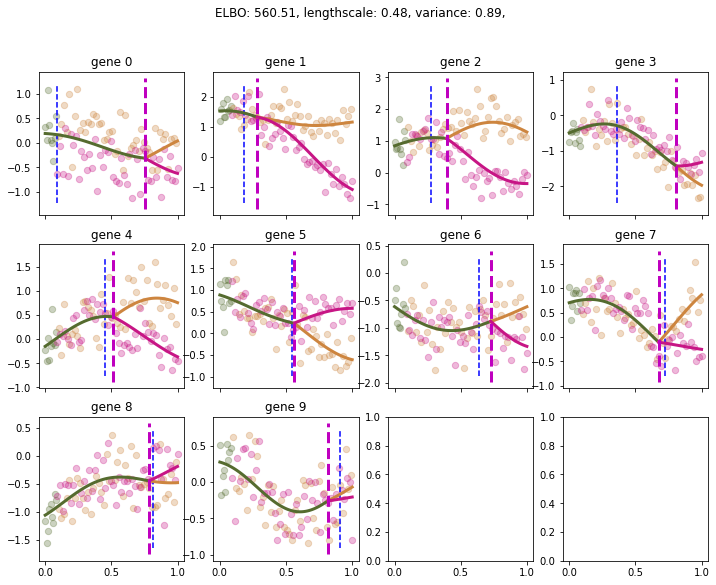

Slicing for gene 0


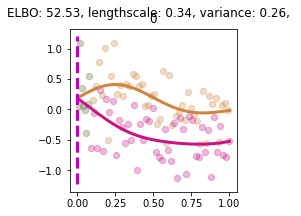

Slicing for gene 1


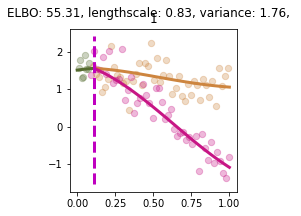

Slicing for gene 2


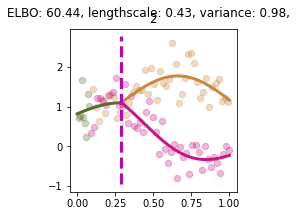

Slicing for gene 3


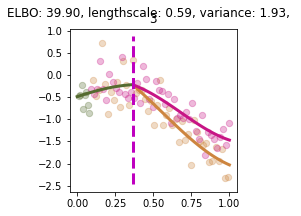

Slicing for gene 4


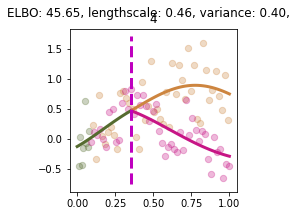

Slicing for gene 5


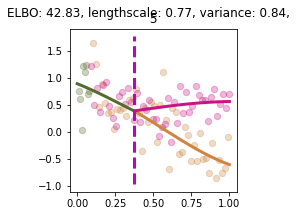

Slicing for gene 6


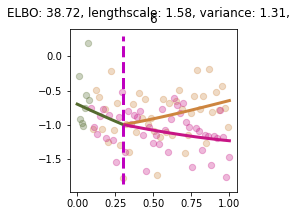

Slicing for gene 7


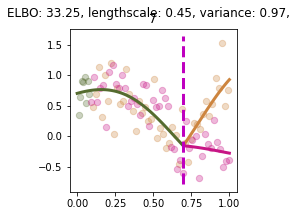

Slicing for gene 8


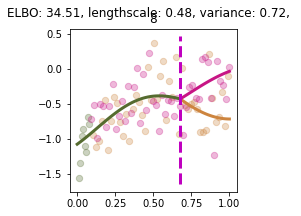

Slicing for gene 9


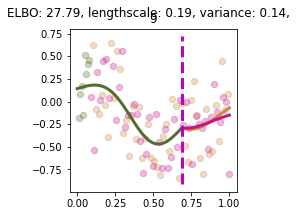

Processing sample 1
Uninformative until idx: 80


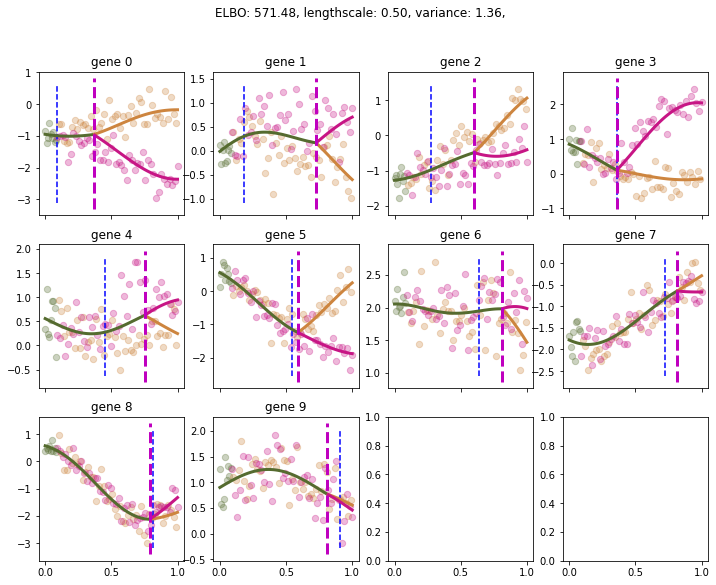

Slicing for gene 0


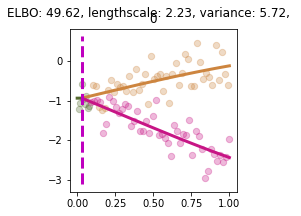

Slicing for gene 1


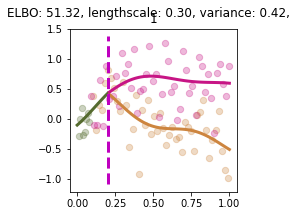

Slicing for gene 2


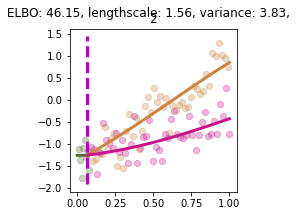

Slicing for gene 3


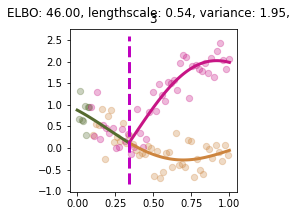

Slicing for gene 4


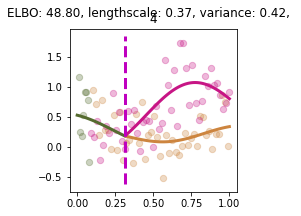

Slicing for gene 5


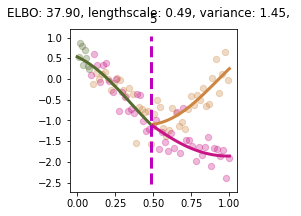

Slicing for gene 6


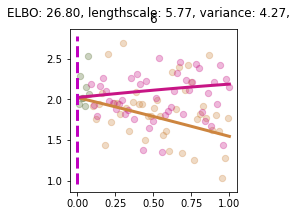

Slicing for gene 7


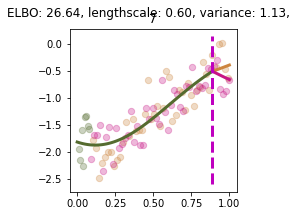

Slicing for gene 8


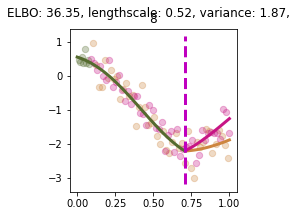

Slicing for gene 9


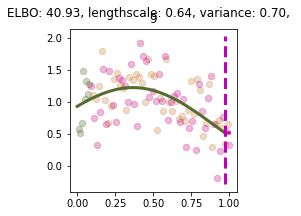

Processing sample 2
Uninformative until idx: 80


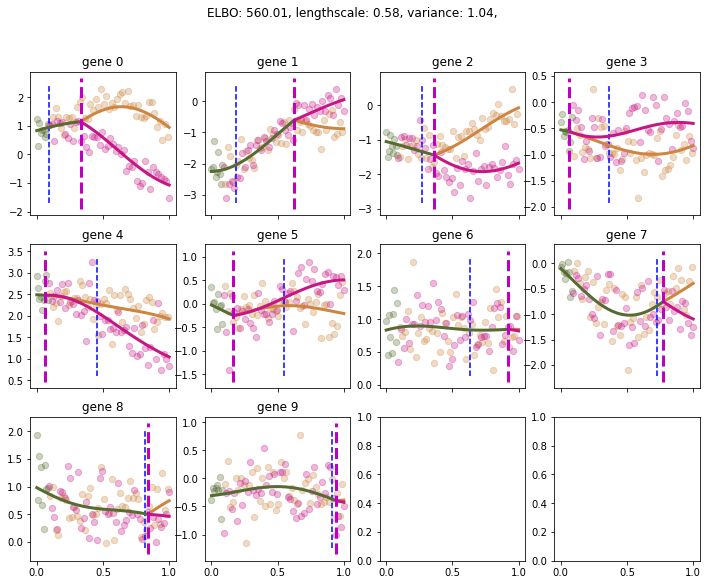

Slicing for gene 0


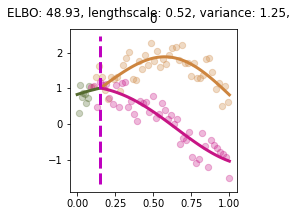

Slicing for gene 1


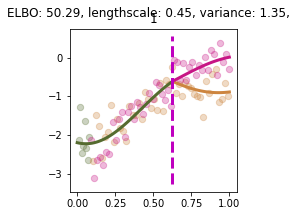

Slicing for gene 2


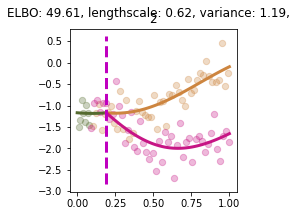

Slicing for gene 3


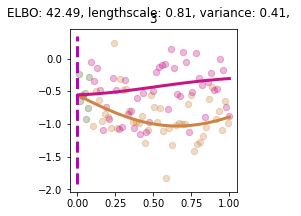

Slicing for gene 4


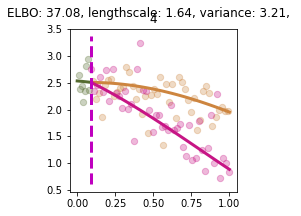

Slicing for gene 5


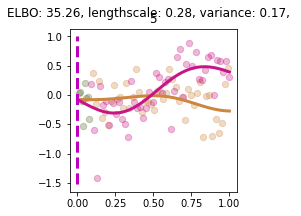

Slicing for gene 6


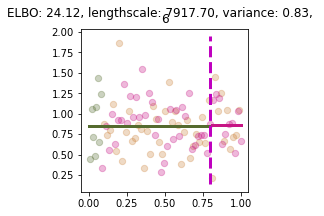

Slicing for gene 7


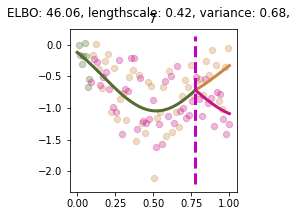

Slicing for gene 8


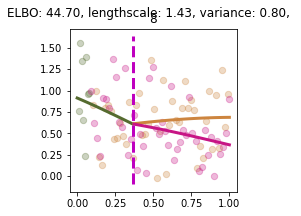

Slicing for gene 9


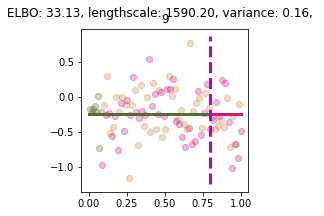

Processing sample 3
Uninformative until idx: 80


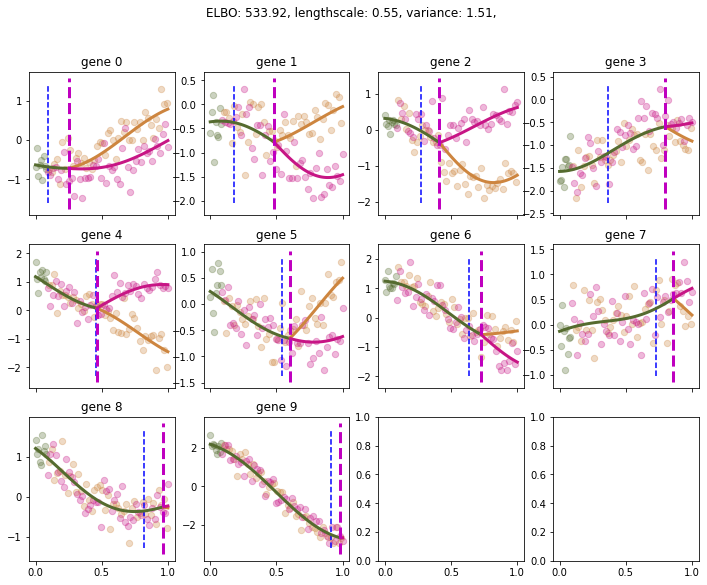

Slicing for gene 0


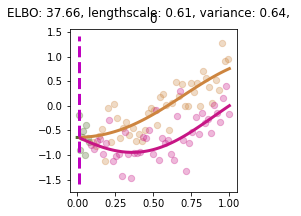

Slicing for gene 1


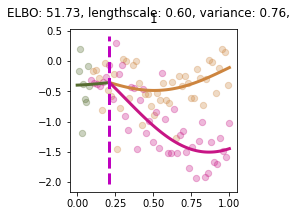

Slicing for gene 2


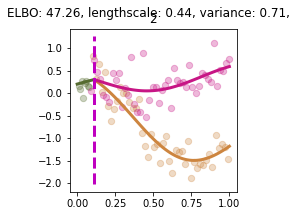

Slicing for gene 3


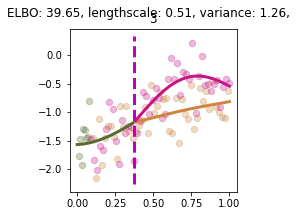

Slicing for gene 4


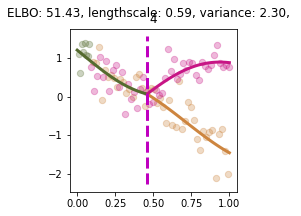

Slicing for gene 5


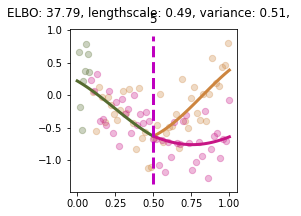

Slicing for gene 6


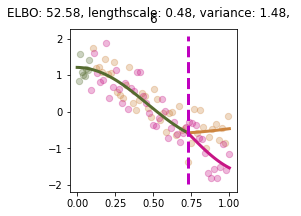

Slicing for gene 7


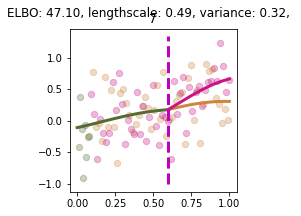

Slicing for gene 8


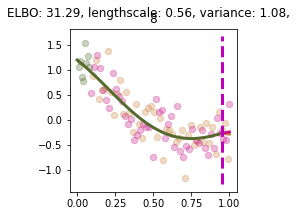

Slicing for gene 9


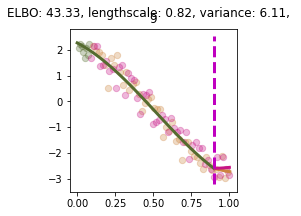

Processing sample 4
Uninformative until idx: 80


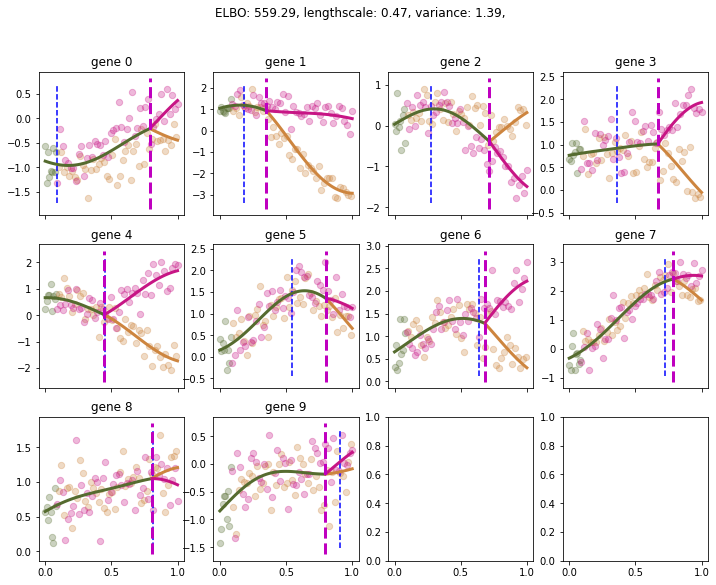

Slicing for gene 0


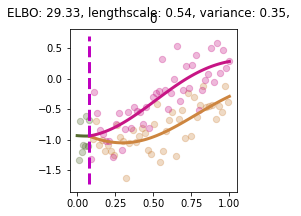

Slicing for gene 1


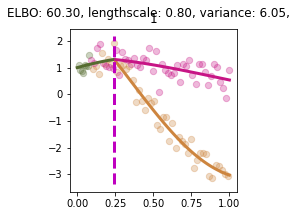

Slicing for gene 2


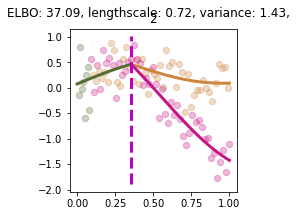

Slicing for gene 3


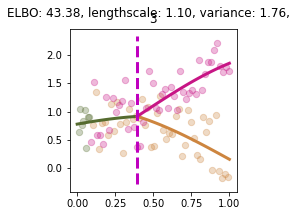

Slicing for gene 4


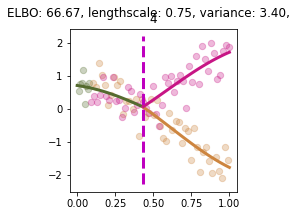

Slicing for gene 5


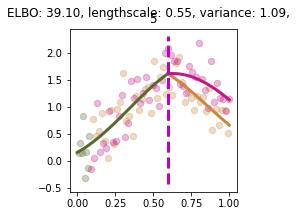

Slicing for gene 6


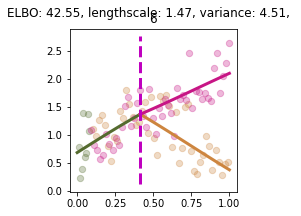

Slicing for gene 7


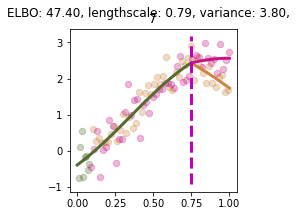

Slicing for gene 8


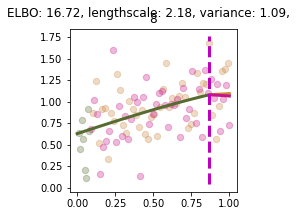

Slicing for gene 9


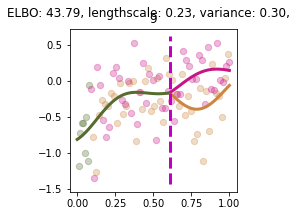

Processing sample 5
Uninformative until idx: 80


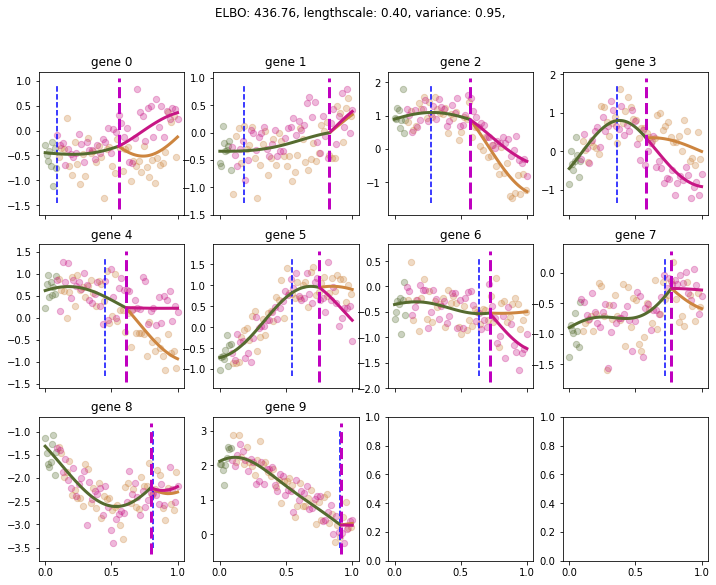

Slicing for gene 0


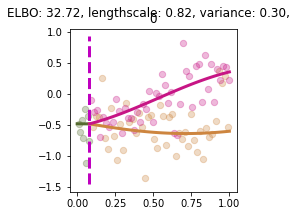

Slicing for gene 1


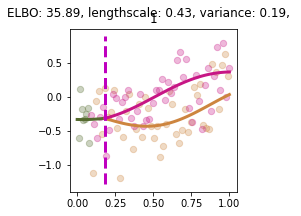

Slicing for gene 2


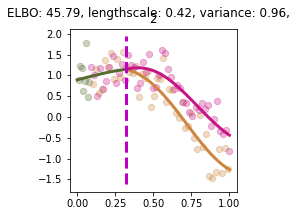

Slicing for gene 3


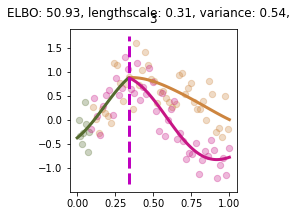

Slicing for gene 4


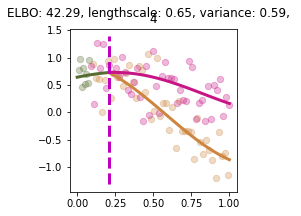

Slicing for gene 5


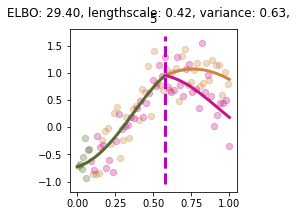

Slicing for gene 6


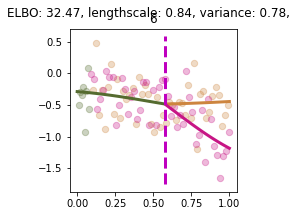

Slicing for gene 7


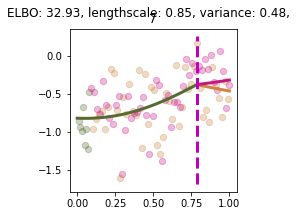

Slicing for gene 8


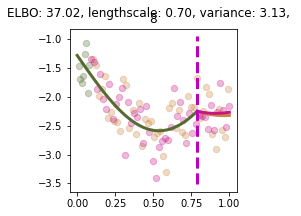

Slicing for gene 9


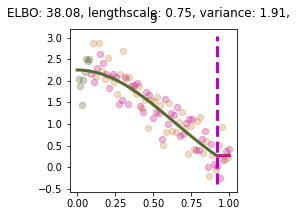

Processing sample 6
Uninformative until idx: 80


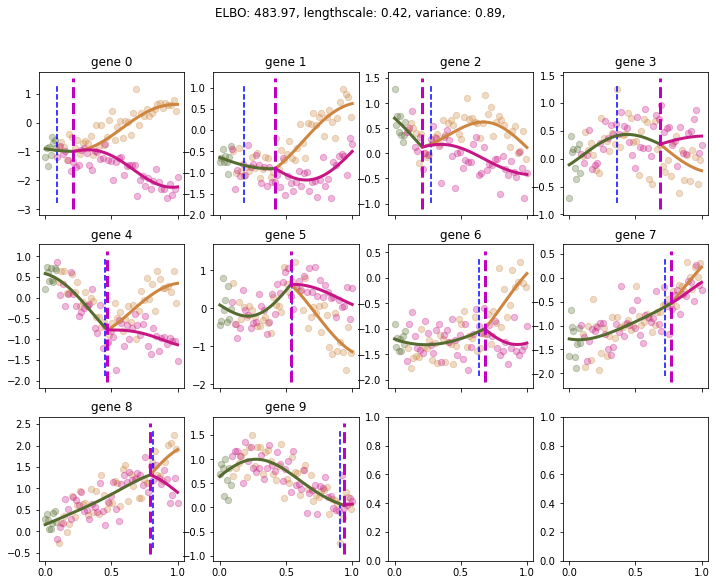

Slicing for gene 0


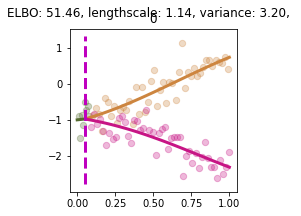

Slicing for gene 1


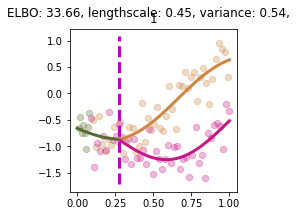

Slicing for gene 2


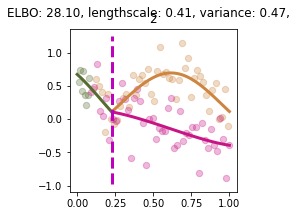

Slicing for gene 3


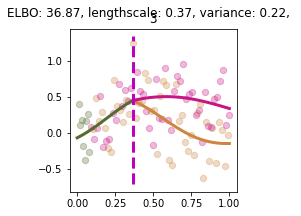

Slicing for gene 4


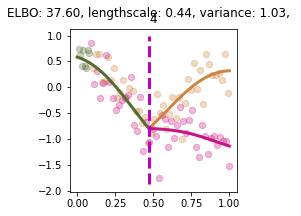

Slicing for gene 5


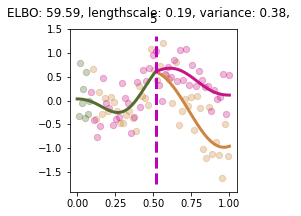

Slicing for gene 6


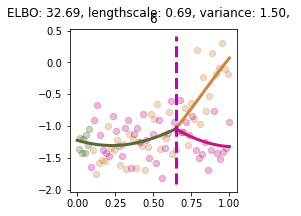

Slicing for gene 7


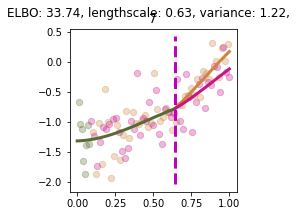

Slicing for gene 8


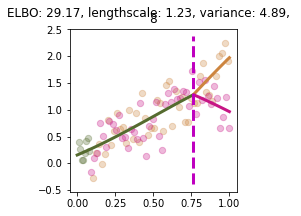

Slicing for gene 9


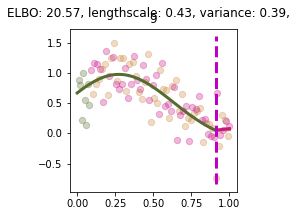

Processing sample 7
Uninformative until idx: 80


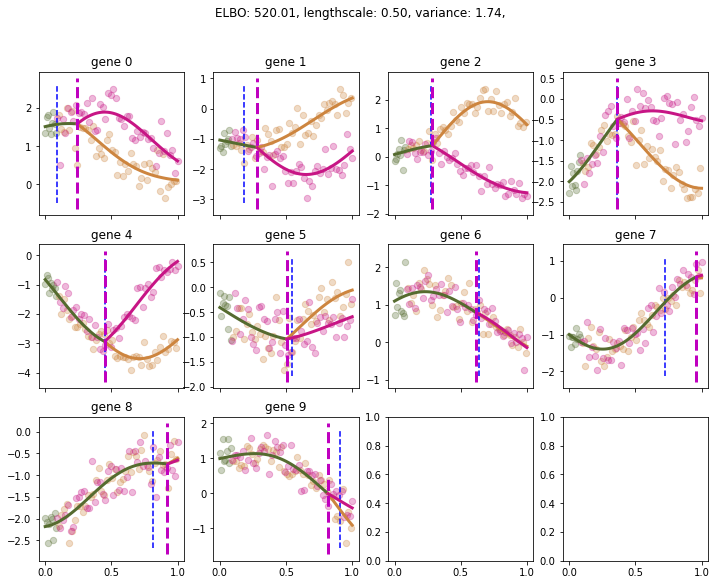

Slicing for gene 0


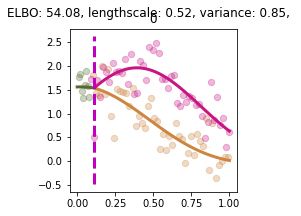

Slicing for gene 1


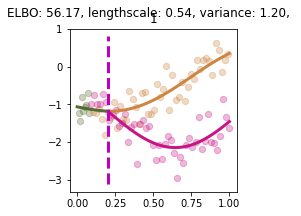

Slicing for gene 2


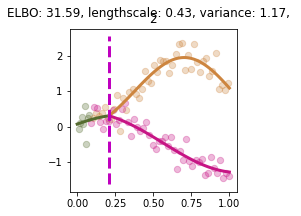

Slicing for gene 3


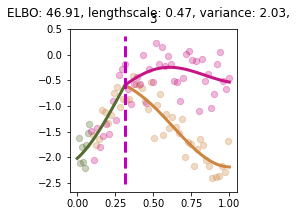

Slicing for gene 4


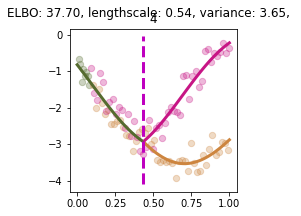

Slicing for gene 5


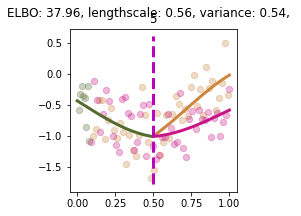

Slicing for gene 6


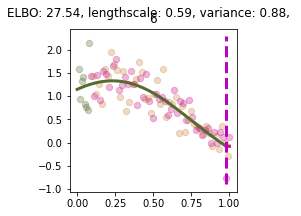

Slicing for gene 7


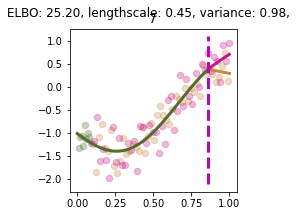

Slicing for gene 8


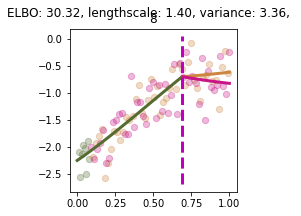

Slicing for gene 9


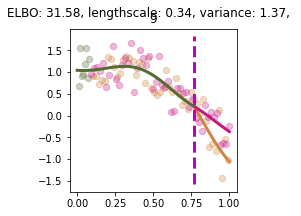

Processing sample 8
Uninformative until idx: 80


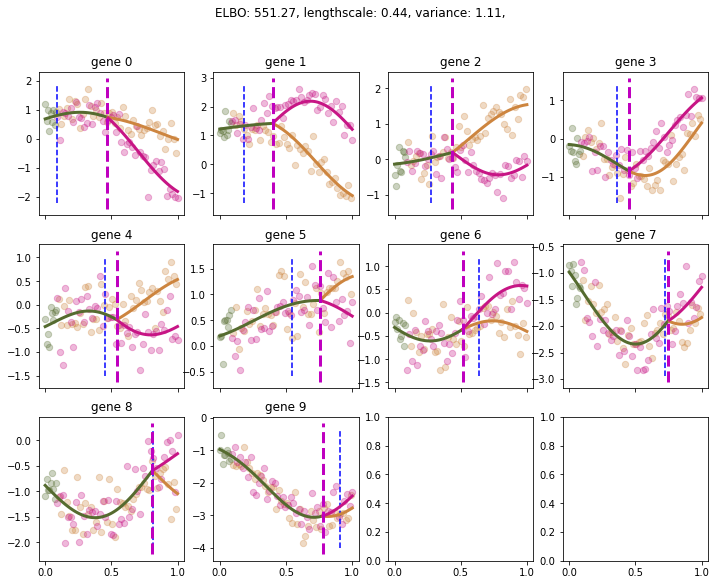

Slicing for gene 0


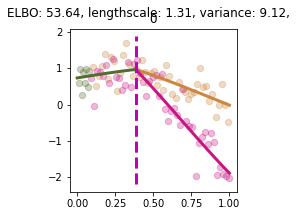

Slicing for gene 1


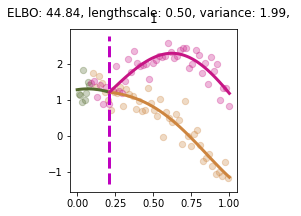

Slicing for gene 2


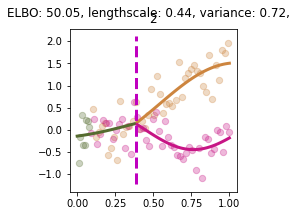

Slicing for gene 3


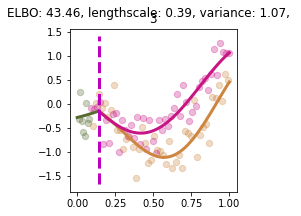

Slicing for gene 4


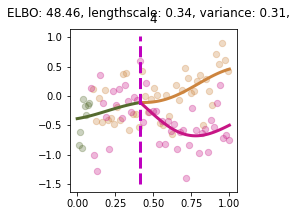

Slicing for gene 5


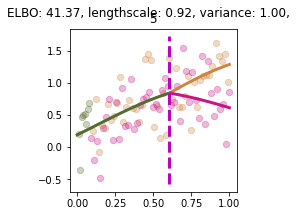

Slicing for gene 6


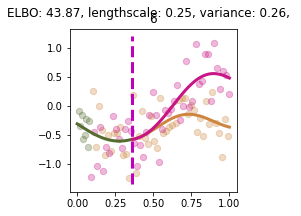

Slicing for gene 7


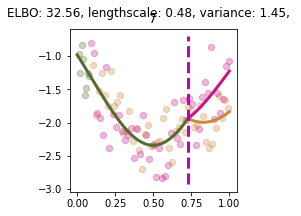

Slicing for gene 8


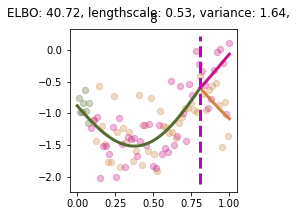

Slicing for gene 9


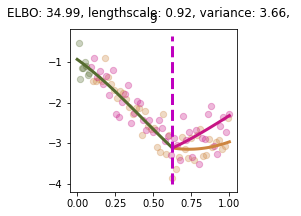

Processing sample 9
Uninformative until idx: 80


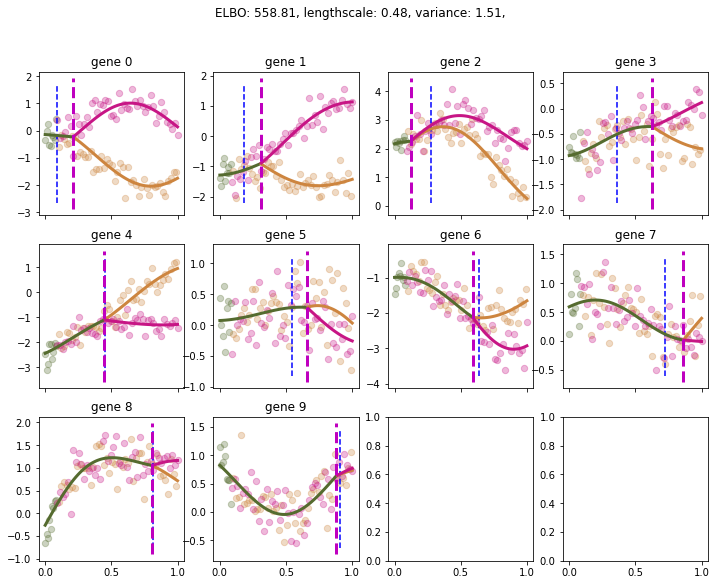

Slicing for gene 0


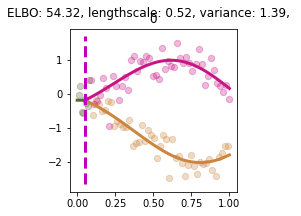

Slicing for gene 1


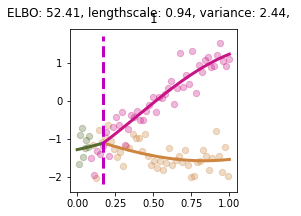

Slicing for gene 2


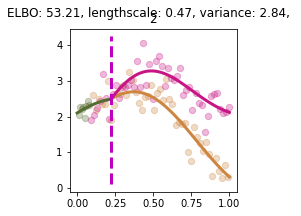

Slicing for gene 3


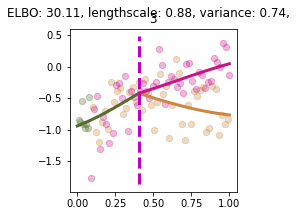

Slicing for gene 4


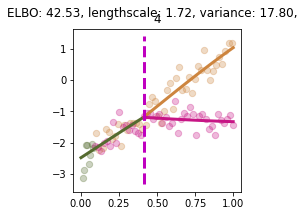

Slicing for gene 5


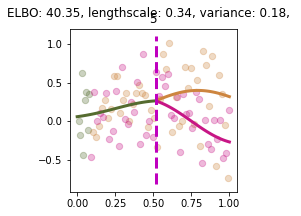

Slicing for gene 6


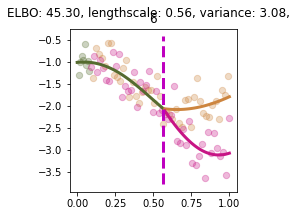

Slicing for gene 7


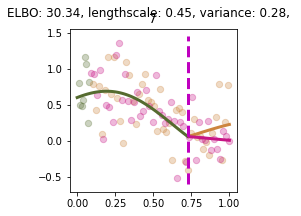

Slicing for gene 8


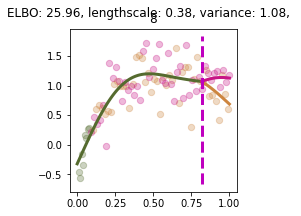

Slicing for gene 9


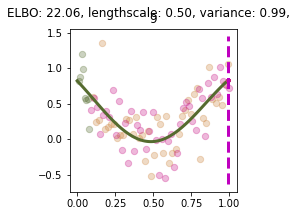

Processing sample 10
Uninformative until idx: 80


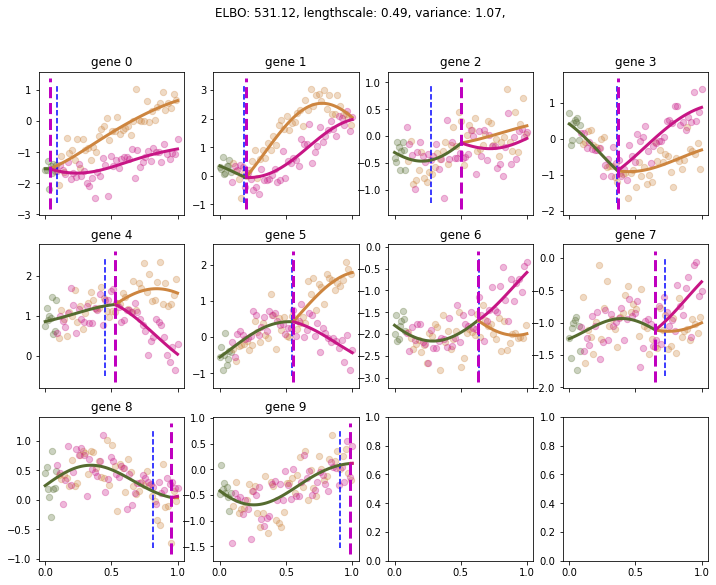

Slicing for gene 0


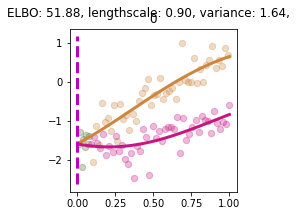

Slicing for gene 1


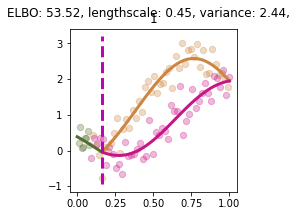

Slicing for gene 2


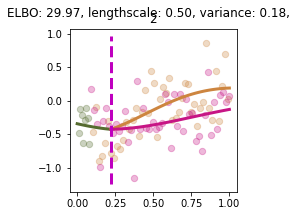

Slicing for gene 3


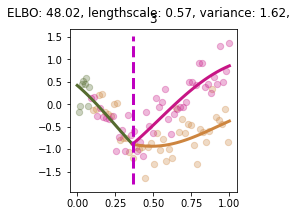

Slicing for gene 4


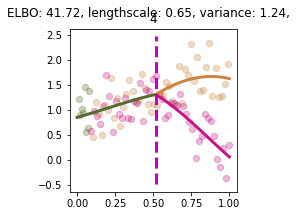

Slicing for gene 5


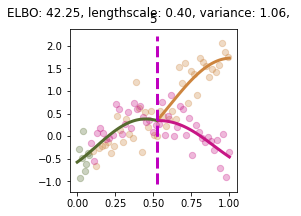

Slicing for gene 6


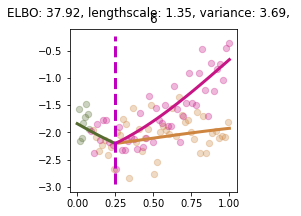

Slicing for gene 7


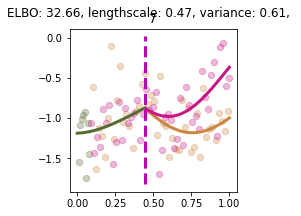

Slicing for gene 8


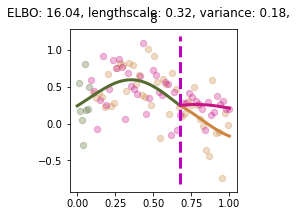

Slicing for gene 9


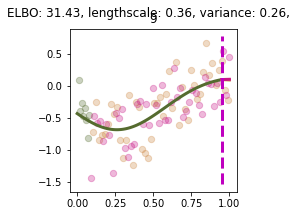

Processing sample 11
Uninformative until idx: 80


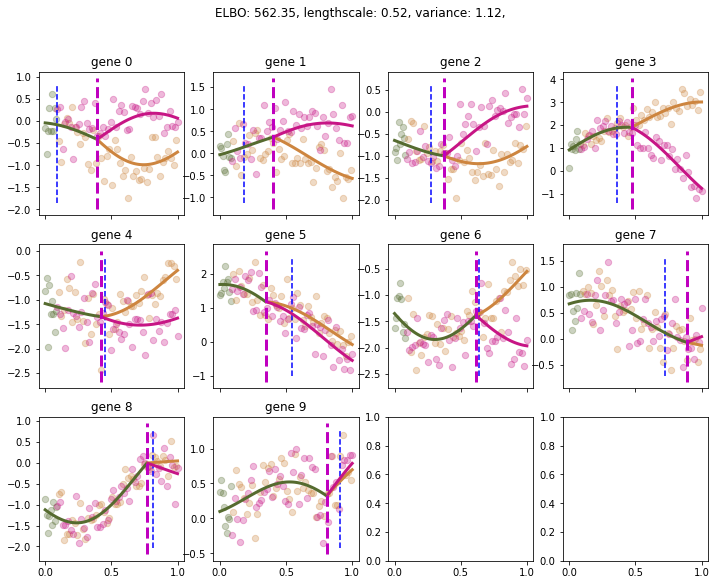

Slicing for gene 0


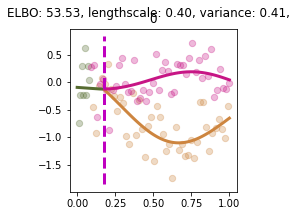

Slicing for gene 1


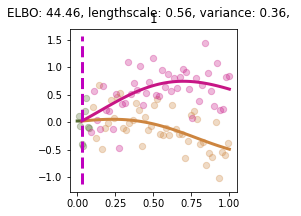

Slicing for gene 2


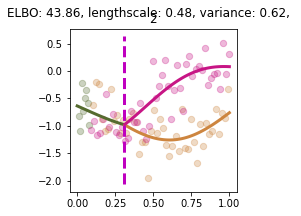

Slicing for gene 3


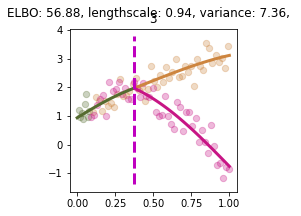

Slicing for gene 4


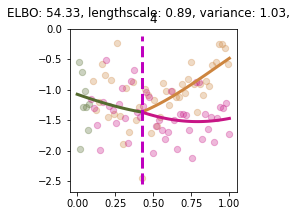

Slicing for gene 5


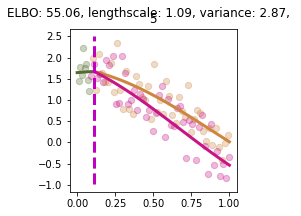

Slicing for gene 6


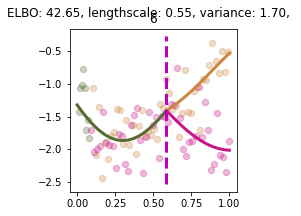

Slicing for gene 7


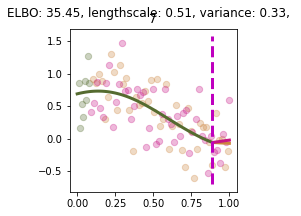

Slicing for gene 8


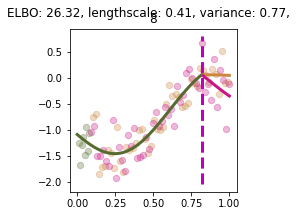

Slicing for gene 9


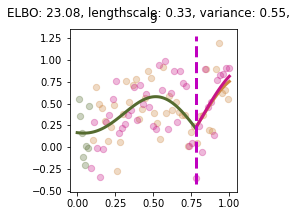

Processing sample 12
Uninformative until idx: 80


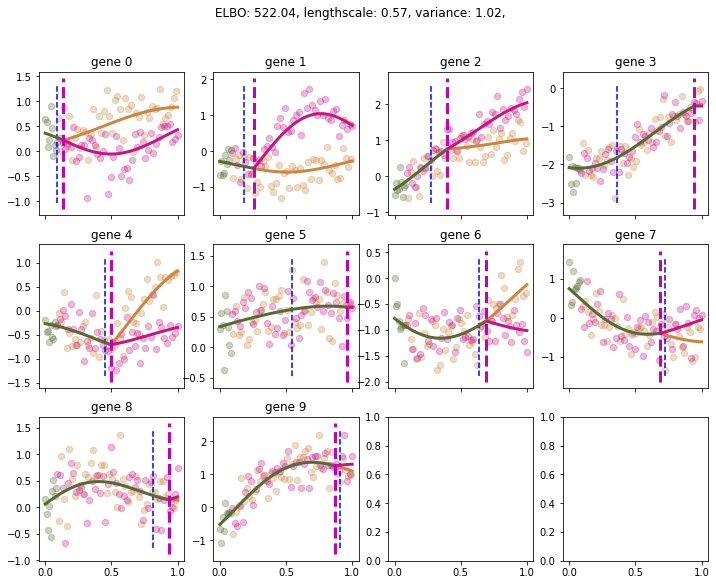

Slicing for gene 0


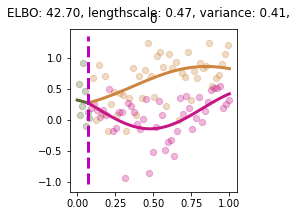

Slicing for gene 1


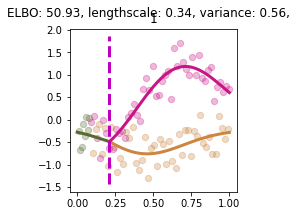

Slicing for gene 2


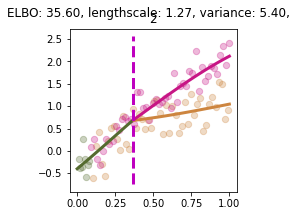

Slicing for gene 3


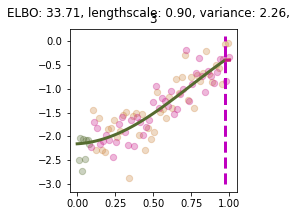

Slicing for gene 4


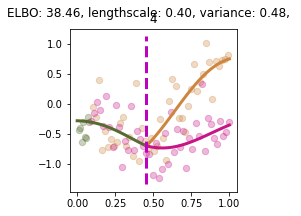

Slicing for gene 5


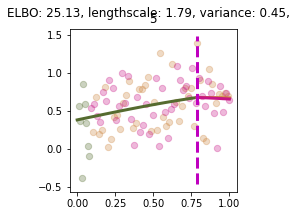

Slicing for gene 6


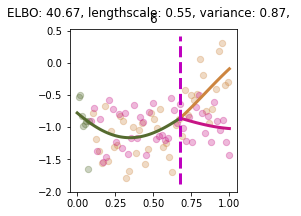

Slicing for gene 7


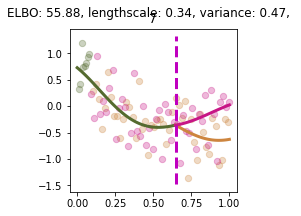

Slicing for gene 8


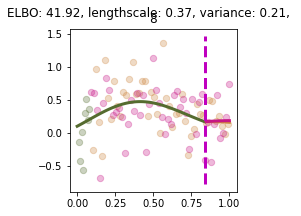

Slicing for gene 9


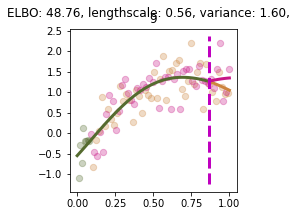

Processing sample 13
Uninformative until idx: 80


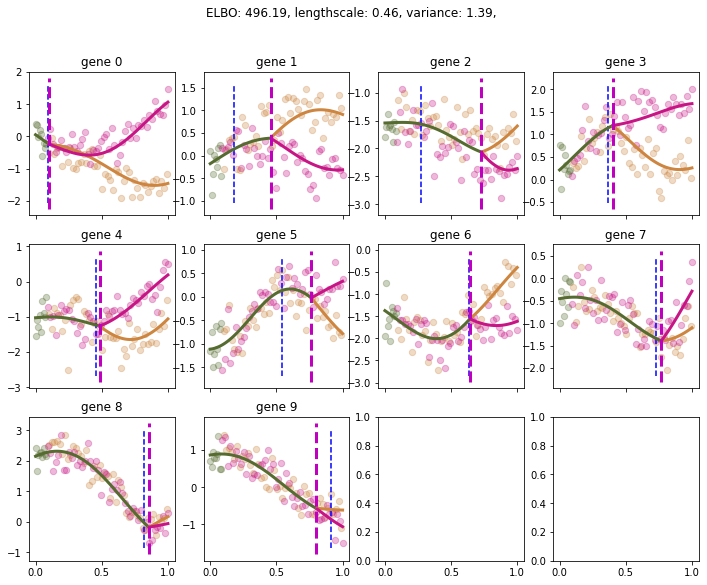

Slicing for gene 0


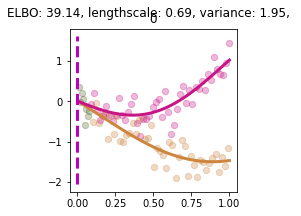

Slicing for gene 1


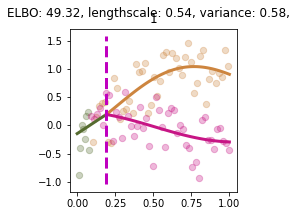

Slicing for gene 2


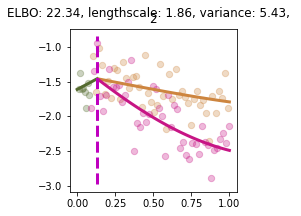

Slicing for gene 3


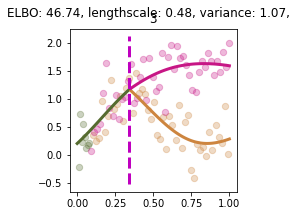

Slicing for gene 4


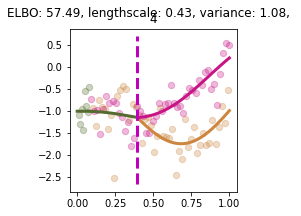

Slicing for gene 5


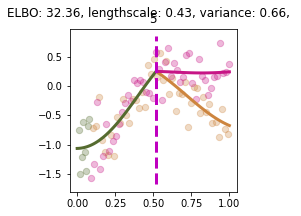

Slicing for gene 6


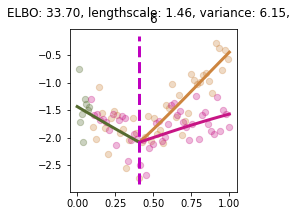

Slicing for gene 7


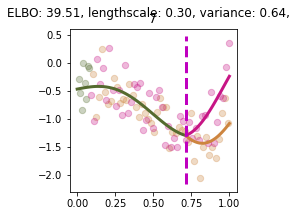

Slicing for gene 8


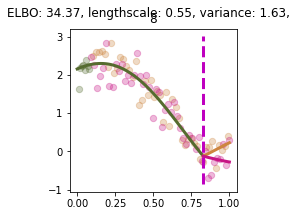

Slicing for gene 9


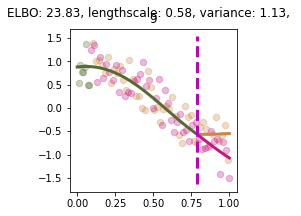

Processing sample 14
Uninformative until idx: 80


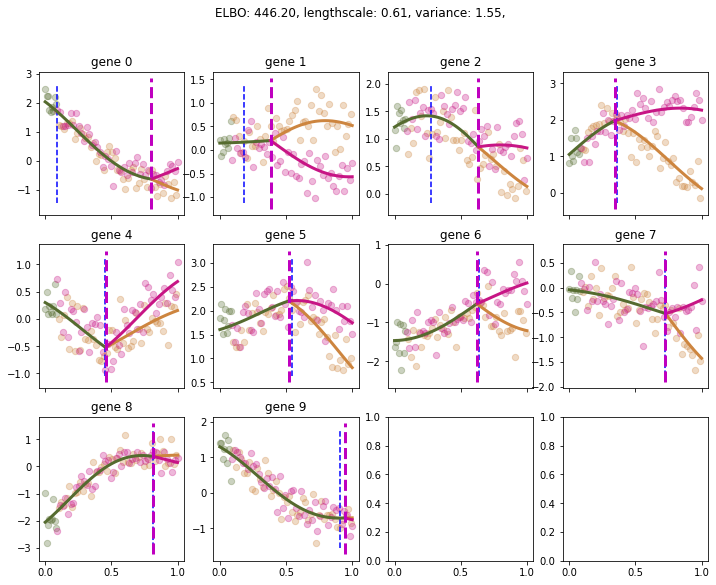

Slicing for gene 0


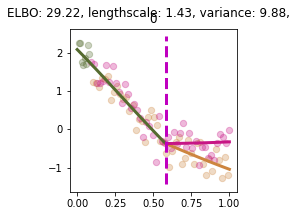

Slicing for gene 1


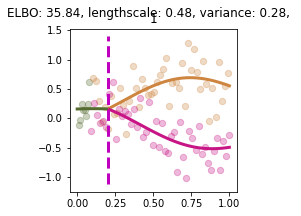

Slicing for gene 2


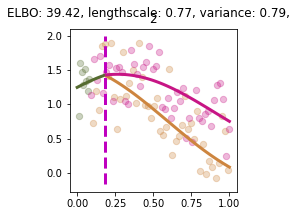

Slicing for gene 3


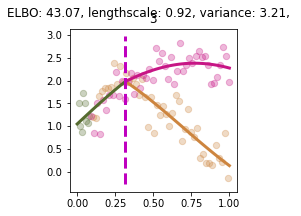

Slicing for gene 4


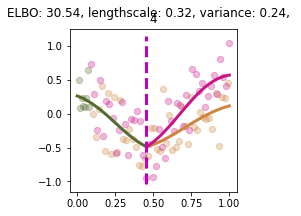

Slicing for gene 5


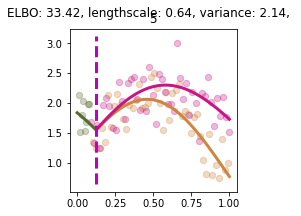

Slicing for gene 6


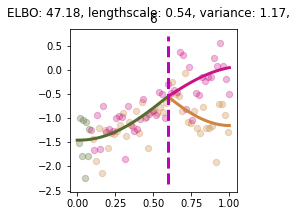

Slicing for gene 7


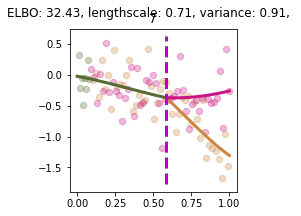

Slicing for gene 8


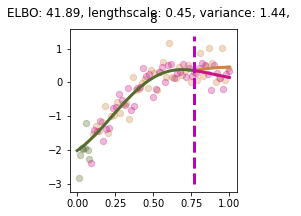

Slicing for gene 9


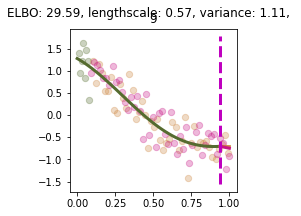

Processing sample 15
Uninformative until idx: 80


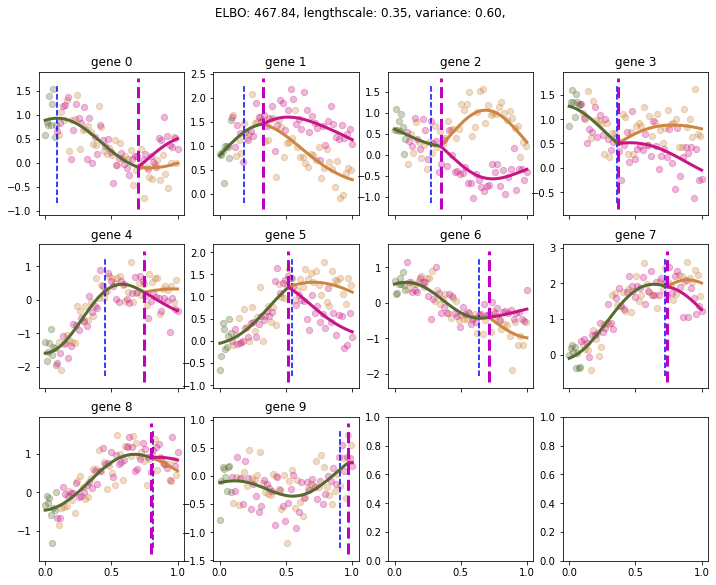

Slicing for gene 0


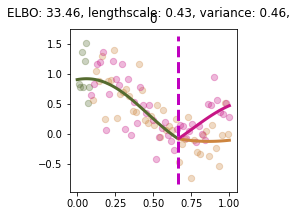

Slicing for gene 1


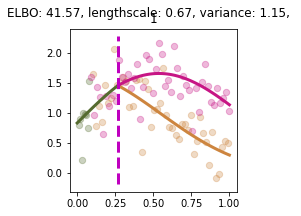

Slicing for gene 2


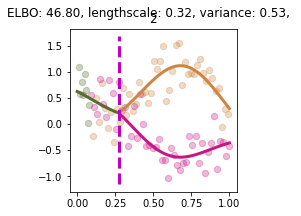

Slicing for gene 3


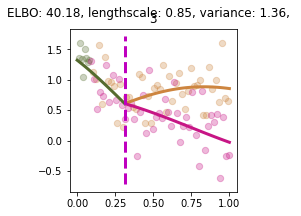

Slicing for gene 4


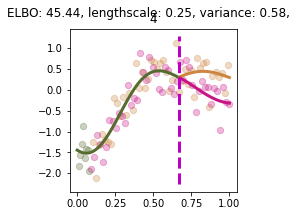

Slicing for gene 5


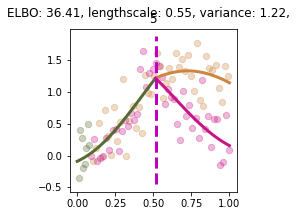

Slicing for gene 6


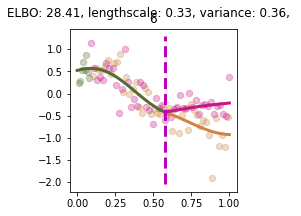

Slicing for gene 7


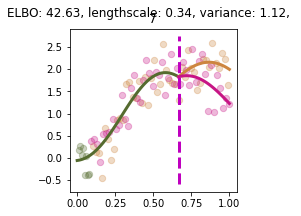

Slicing for gene 8


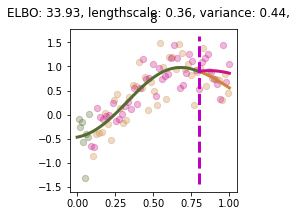

Slicing for gene 9


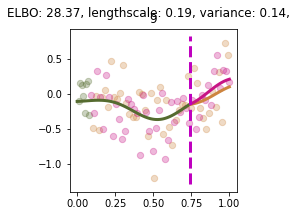

Processing sample 16
Uninformative until idx: 80


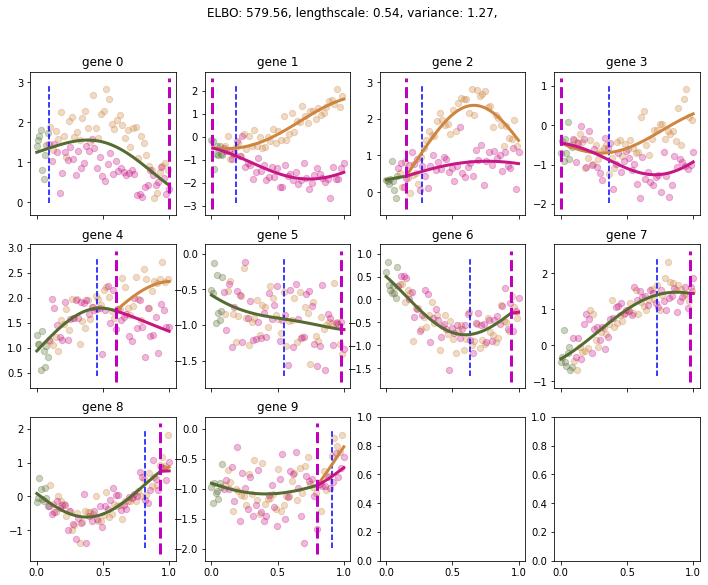

Slicing for gene 0


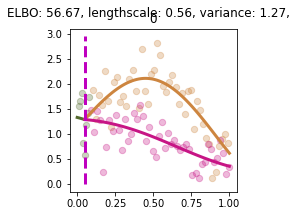

Slicing for gene 1


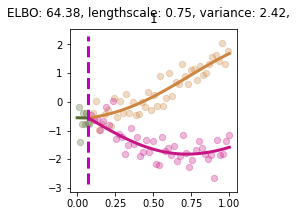

Slicing for gene 2


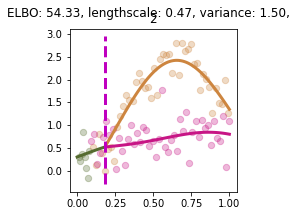

Slicing for gene 3


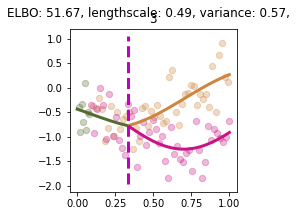

Slicing for gene 4


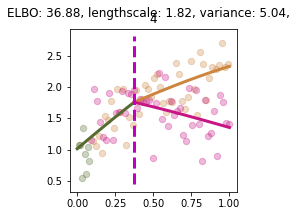

Slicing for gene 5


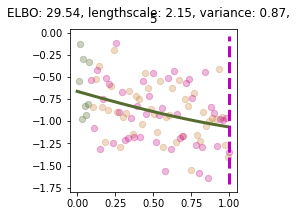

Slicing for gene 6


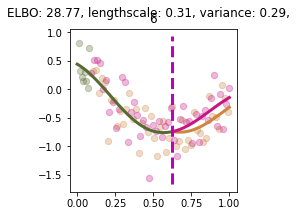

Slicing for gene 7


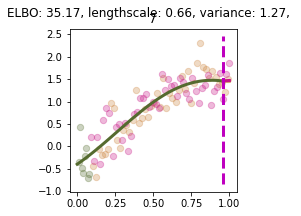

Slicing for gene 8


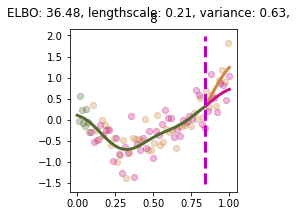

Slicing for gene 9


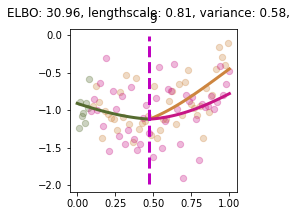

Processing sample 17
Uninformative until idx: 80


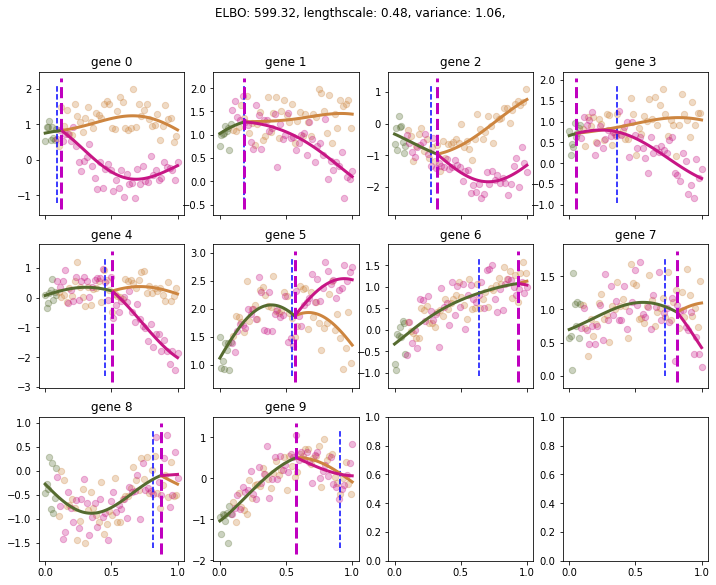

Slicing for gene 0


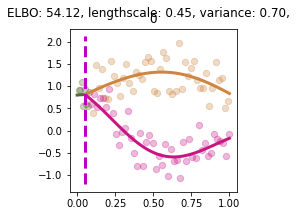

Slicing for gene 1


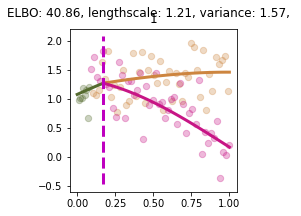

Slicing for gene 2


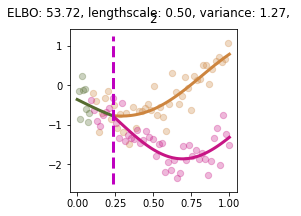

Slicing for gene 3


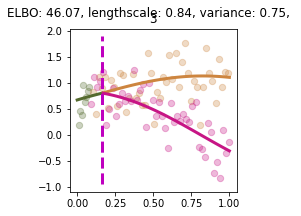

Slicing for gene 4


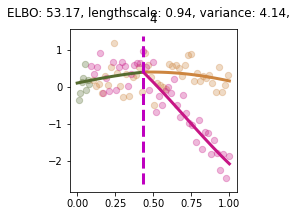

Slicing for gene 5


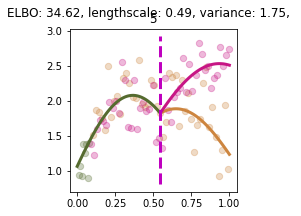

Slicing for gene 6


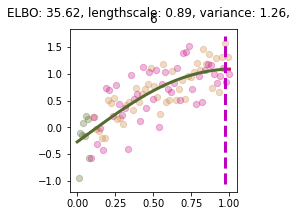

Slicing for gene 7


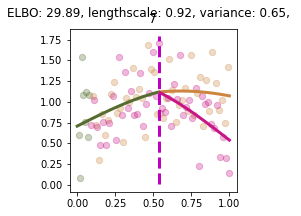

Slicing for gene 8


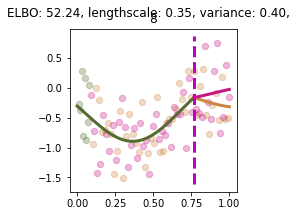

Slicing for gene 9


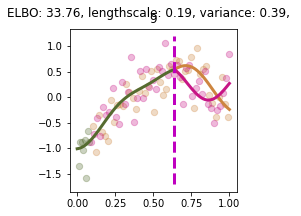

Processing sample 18
Uninformative until idx: 80


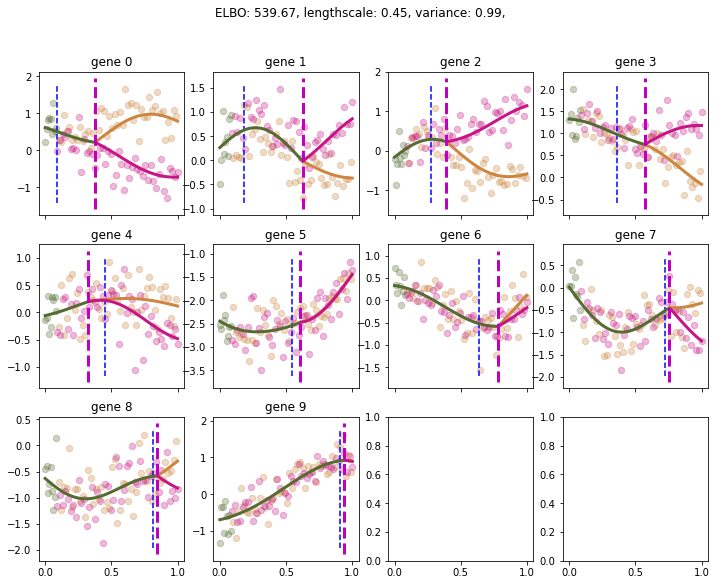

Slicing for gene 0


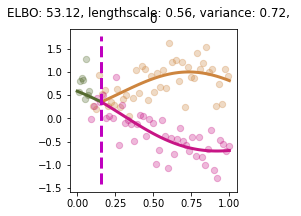

Slicing for gene 1


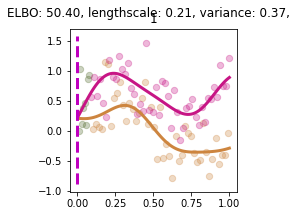

Slicing for gene 2


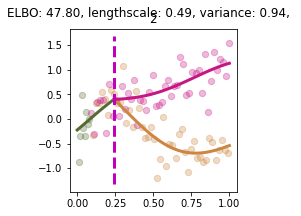

Slicing for gene 3


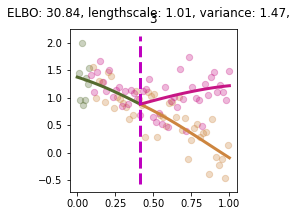

Slicing for gene 4


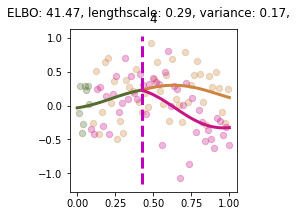

Slicing for gene 5


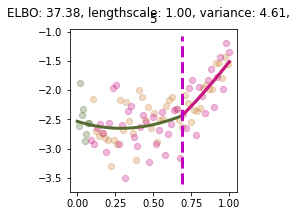

Slicing for gene 6


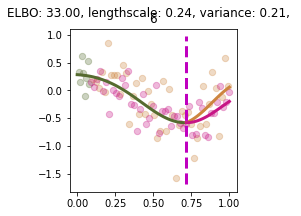

Slicing for gene 7


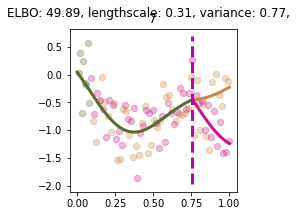

Slicing for gene 8


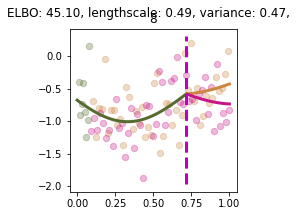

Slicing for gene 9


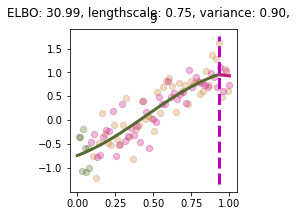

Processing sample 19
Uninformative until idx: 80


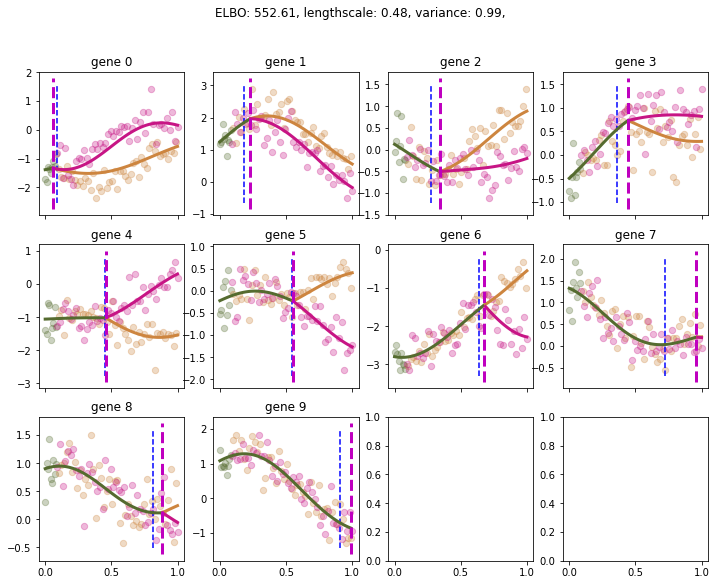

Slicing for gene 0


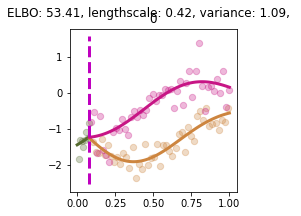

Slicing for gene 1


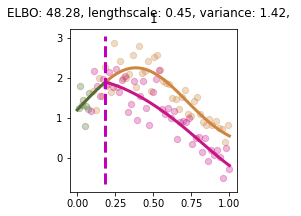

Slicing for gene 2


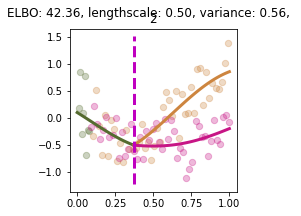

Slicing for gene 3


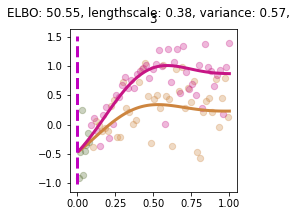

Slicing for gene 4


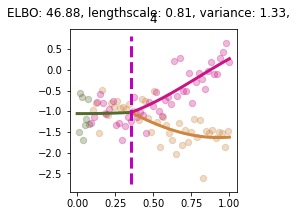

Slicing for gene 5


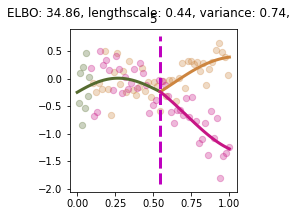

Slicing for gene 6


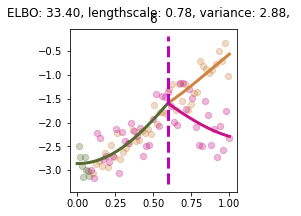

Slicing for gene 7


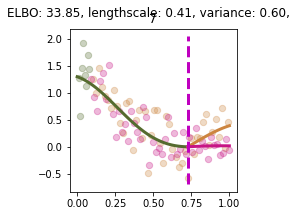

Slicing for gene 8


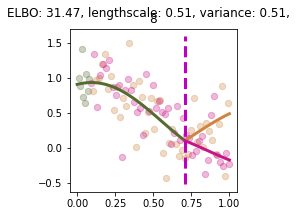

Slicing for gene 9


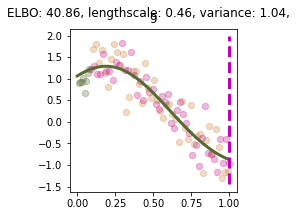

In [80]:
from dataclasses import dataclass
from typing import List


@dataclass
class Result:
    data: GeneExpressionData  # the data we have attempted to fit models to
    true_bps: np.ndarray  # true branching points
    mmbgp: AssignGP  # the trained MMBGP model for the provided data
    bgps: Sequence[AssignGP]  # the trained BGP models for the provided data


NUM_SAMPLES = 20
BGP_PRIOR_CONFIDENCE = 0.8
MMBGP_UNINFORMATIVE_UNTIL = 0.8
MMBGP_INFORMATIVE_PRIOR_CONFIDENCE = 1.
TRUE_BPS = [i/11 for i in range(1, 11, 1)]

# Defining the model to sample from
NOISE = 0.1
LENGTHSCALE = 0.5
dummy_model = get_assigngp_with_target_bps(
    TRUE_BPS, 
    lengthscale=LENGTHSCALE, 
    noise_variance=NOISE,
)
synthetic_noisy_data = get_synthetic_noisy_branched_data(
    dummy_model, 
    num_samples=NUM_SAMPLES, 
    x_pts=100,
)

results: List[Result] = []

for i, data in enumerate(synthetic_noisy_data):
    print(f"Processing sample {i}")
    
    #
    # MMBGP
    #
    mmbgp = construct_assigngp_model(
        gene_expression=data,
        phi_constructor=FunkyPrior(
            data,
            informative_prior_confidence=MMBGP_INFORMATIVE_PRIOR_CONFIDENCE, 
            uninformative_until=MMBGP_UNINFORMATIVE_UNTIL,
        ),
        initial_branching_points=[0.5]*10,  # Don't start at the true locations
    )    
    optimiser = ElvijsAmazingOptimiser()
    trained_mmbgp = optimiser.train(mmbgp)    
    plot_model_snapshot(trained_mmbgp, genes=data, alpha=0.3)
    plt.show()
    
    #
    # BGPs
    #
    bgps = []

    for i in range(data.num_genes):
        print(f"Slicing for gene {i}")
    
        sliced_data = GeneExpressionData(
            t=data.t,
            Y=data.Y[:, i].reshape(-1, 1),
            state=data.state,
            gene_labels=[f"{i}"]
        )
   
        # new model with default-ey parameter values, but SimplePhiConstructor
        bgp = construct_assigngp_model(
            gene_expression=sliced_data,
            phi_constructor=SimplePhiConstructor(sliced_data, BGP_PRIOR_CONFIDENCE),
            initial_branching_points=[0.5],  # Don't start at the true locations
        )    
        optimiser = ElvijsAmazingOptimiser()
        trained_bgp = optimiser.train(bgp)

        plot_model_snapshot(trained_bgp, genes=sliced_data, alpha=0.3)
        plt.show()
    
        bgps.append(trained_bgp)
    
    result = Result(
        data=data,
        true_bps=np.array(TRUE_BPS),
        mmbgp=trained_mmbgp,
        bgps=bgps,
    )
    results.append(result)

In [89]:
import pandas as pd


def rmse(a: np.ndarray, b: np.ndarray) -> float:
    assert a.shape == b.shape
    n = a.shape[0]
    return np.sqrt(((a - b)**2).mean())


def convert_results_to_df(res: Sequence[Result], inconsistency_threshold: float = 0.8) -> pd.DataFrame:
    dictified_results = []
    
    for i, r in enumerate(res):
        dres = dict(
            sample_id=i,
            mmbgp_bp_rmse=rmse(r.true_bps, r.mmbgp.BranchingPoints),
            bgp_bp_rmse=rmse(r.true_bps, np.array([bgp.BranchingPoints[0] for bgp in r.bgps])),
            inconsistent_branches=count_branch_inconsistencies(r.bgps, inconsistency_threshold),
            inconsistent_all=count_branch_inconsistencies(r.bgps, inconsistency_threshold, only_branches=False),
        )
        dictified_results.append(dres)
    
    return pd.DataFrame(dictified_results)

In [90]:
df = convert_results_to_df(results, inconsistency_threshold=0.6)

In [91]:
df.head(30)

,sample_id,mmbgp_bp_rmse,bgp_bp_rmse,inconsistent_branches,inconsistent_all
0,0,0.262280,0.153146,12,18
1,1,0.248840,0.227625,19,19
2,2,0.271770,0.318985,16,17
3,3,0.194772,0.088618,7,7
4,4,0.298503,0.125740,7,8
5,5,0.290513,0.085442,17,17
6,6,0.136075,0.048901,3,6
7,7,0.104287,0.134862,7,8
8,8,0.175978,0.176669,13,14
9,9,0.124961,0.045003,11,11


In [92]:
df.describe()

,sample_id,mmbgp_bp_rmse,bgp_bp_rmse,inconsistent_branches,inconsistent_all
count,20.00000,20.000000,20.000000,20.000000,20.000000
mean,9.50000,0.204996,0.153209,10.400000,12.750000
std,5.91608,0.075604,0.067911,4.488582,4.940435
min,0.00000,0.090986,0.045003,3.000000,6.000000
25%,4.75000,0.150776,0.097155,7.000000,8.750000
50%,9.50000,0.194917,0.158179,8.500000,11.000000
75%,14.25000,0.260700,0.206588,13.000000,17.250000
max,19.00000,0.372374,0.318985,19.000000,22.000000
